In [ ]:
# Set the path to the directory where the min/max values will be saved
minmax_save_path = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/min_max"

# Set the path to the directory where a trained model is stored
model_path = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/model/model.pth"

# Set the path to the directory where the spectrograms will be saved
save_path = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/spectrograms"

save_path_prueba = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/prueba_luis/specs"


## Data extraction and preprocess

In [ ]:
%%capture
!pip install nussl
!pip install git+https://github.com/source-separation/tutorial

In [ ]:
!pip show nussl

In [ ]:
!which python

/usr/local/bin/python


In [ ]:
from IPython.display import Audio

In [ ]:
import nussl

import IPython
from common import viz

ModuleNotFoundError: ignored

In [ ]:
# Run this command to download X 7-second clips from MUSDB18
musdb = nussl.datasets.MUSDB18(download=True)

In [ ]:
musdb_train = nussl.datasets.MUSDB18(subsets=['train'])

In [ ]:
idx = 0
item = musdb_train[idx]
item.keys()

dict_keys(['mix', 'sources', 'metadata'])

In [ ]:
item['metadata']

{'labels': ['bass', 'drums', 'other', 'vocals']}

In [ ]:
item['sources'].keys()

dict_keys(['drums', 'bass', 'other', 'vocals'])

In [ ]:
Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate)

In [ ]:
for stem_label in item['sources'].keys():
    print(stem_label)
    audio_player = Audio(data=item['sources'][stem_label].audio_data, rate=item['sources'][stem_label].sample_rate)
    IPython.display.display(audio_player)

drums


bass


other


vocals


In [ ]:
Audio(data=item['mix'].audio_data, rate=item['mix'].sample_rate)

In [ ]:
# Function to normalize an audio signal
def normalize(signal):
    return (signal - signal.min()) / (signal.max() - signal.min())
    
# Function to denormalize an audio signal
def denormalize(signal, max_val, min_val):
    return signal * (max_val - min_val) + min_val

In [ ]:
# Loop over all the audios in the dataset
index = 0
for item in musdb_train: 
  index += 1 
  sr = item['mix'].sample_rate
  audio = item['mix'].audio_data
  audio = librosa.resample(audio, orig_sr = sr, target_sr = 44_100)

  # Fix the length of the audio to 308700 samples (7 seconds at 44.1 kHz)
  audio = librosa.util.fix_length(audio, size=int(308700))

  # Convert to mono audio
  audio = librosa.to_mono(audio)

  # Normalize the audio signal
  audio = librosa.util.normalize(audio)

  # Compute the short-time Fourier transform (STFT) of the audio
  #stft = librosa.stft(audio, n_fft=1024, hop_length=512)
  mel_spectrogram = librosa.feature.melspectrogram(y=audio, sr=44100, n_fft=1024, hop_length=512)

  # Convert the STFT to a log-magnitude spectrogram
  #log_spectrogram = librosa.amplitude_to_db(np.abs(stft))
  log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

  # Normalize the log-magnitude spectrogram
  spec_norm = normalize(log_mel_spectrogram)

  # Save the normalized spectrogram to a .npy file
  file_name =  str(index) + '_mix'
  np.save(os.path.join(save_path, file_name + '.npy'), spec_norm)

  # Compute the min/max values of the log-magnitude spectrogram
  min_max = [np.min(log_mel_spectrogram), np.max(log_mel_spectrogram)]

  # Save the min/max values to a .npy file
  np.save(os.path.join(minmax_save_path, file_name + '.npy'), min_max)

  for stem_label in item['sources'].keys():
    # Load the audio file and resample to a sampling rate of 44.1 kHz
    sr = item['sources'][stem_label].sample_rate
    audio = item['sources'][stem_label].audio_data
    audio = librosa.resample(audio, orig_sr = sr, target_sr = 44_100)

    # Fix the length of the audio to 308700 samples (7 seconds at 44.1 kHz)
    audio = librosa.util.fix_length(audio, size=int(308700))

    # Convert to mono audio
    audio = librosa.to_mono(audio)

    # Normalize the audio signal
    audio = librosa.util.normalize(audio)

    # Compute the short-time Fourier transform (STFT) of the audio
    #stft = librosa.stft(audio, n_fft=1024, hop_length=512)
    mel_spectrogram = librosa.feature.melspectrogram(y=audio, sr=44100, n_fft=1024, hop_length=512)

    # Convert the STFT to a log-magnitude spectrogram
    #log_spectrogram = librosa.amplitude_to_db(np.abs(stft))
    log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

    # Normalize the log-magnitude spectrogram
    spec_norm = normalize(log_mel_spectrogram)

    # Save the normalized spectrogram to a .npy file
    file_name =  str(index) + '_' + stem_label
    np.save(os.path.join(save_path, file_name + '.npy'), spec_norm)

    # Compute the min/max values of the log-magnitude spectrogram
    min_max = [np.min(log_mel_spectrogram), np.max(log_mel_spectrogram)]

    # Save the min/max values to a .npy file
    np.save(os.path.join(minmax_save_path, file_name + '.npy'), min_max)


# Imports

In [ ]:
%%capture
!pip install pycrypto
!pip install pytorch
!sudo apt-get install libportaudio2
!pip install sounddevice

In [ ]:
import os
import librosa
import librosa.display
import numpy as np
from tqdm import tqdm
import base64
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import pickle
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import sounddevice as sd
import plotly.graph_objects as go

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


# Data Check

In [ ]:
!git clone https://github.com/NVIDIA/BigVGAN.git

Cloning into 'BigVGAN'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 59 (delta 19), reused 46 (delta 12), pack-reused 0
Unpacking objects: 100% (59/59), 14.46 MiB | 5.28 MiB/s, done.


In [ ]:
ls BigVGAN/

activations.py     env.py            LibriTTS/      parse_scripts/    train.py
alias_free_torch/  incl_licenses/    LICENSE        __pycache__/      utils.py
BigVGAN/           inference_e2e.py  meldataset.py  README.md
configs/           inference.py      models.py      requirements.txt


In [ ]:
! pip install -r BigVGAN/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.8/203.8 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 59.2 MB/s eta 0:00:00
  Created wheel for pesq: filename=pesq-0.0.4-cp310-cp310-linux_x86_64.whl size=255305 sha256=9180083143419045623a101d1a792a61ad886bde51b4e5e3eabd114dcc1d9851
  Stored in directory: /root/.cache/pip/wheels/c5/4e/2c/251524370c0fdd659e99639a0fbd0ca5a782c3aafcd456b28d
Successfully built pesq
  Attempting uninstall: librosa
    Found existing installation: librosa 0.10.0.post2
    Uninstalling librosa-0.10.0.post2:
      Successfully uninstalled librosa-0.10.0.post2


In [ ]:
cd BigVGAN

/content/BigVGAN


In [ ]:
ls

activations.py     incl_licenses/    LICENSE         README.md
alias_free_torch/  inference_e2e.py  meldataset.py   requirements.txt
configs/           inference.py      models.py       train.py
env.py             LibriTTS/         parse_scripts/  utils.py


In [ ]:
from models import BigVGAN as Generator

In [ ]:
def load_checkpoint(filepath, device):
    print(filepath)
    assert os.path.isfile(filepath)
    print("Loading '{}'".format(filepath))
    checkpoint_dict = torch.load(filepath, map_location=device)
    print("Complete.")
    return checkpoint_dict

In [ ]:
save_path_prueba = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/prueba_luis/specs"

In [ ]:
from meldataset import mel_spectrogram, MAX_WAV_VALUE
import os
import json
import torch
from env import AttrDict
checkpoint_file = "/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/"

config_file = os.path.join(os.path.split(checkpoint_file)[0], 'config.json')
with open(config_file) as f:
    data = f.read()

global h
json_config = json.loads(data)
h = AttrDict(json_config)

torch.manual_seed(h.seed)

def get_mel(x):
    return mel_spectrogram(x, h.n_fft, 100, h.sampling_rate, h.hop_size, h.win_size, h.fmin, h.fmax)

The next function saves the spectrograms using the function used by the BigVGAN designers

In [ ]:
import librosa
import numpy as np
# Loop over all the audios in the dataset
index = 0
MAX_SPEC = 0
with torch.no_grad():
  for item in musdb_train: 
    # This first layer of the loop calculates the Mel spectro
    index += 1 
    sr = item['mix'].sample_rate
    audio = item['mix'].audio_data
    audio = librosa.resample(audio, orig_sr = sr, target_sr = 24000)

    # Fix the length of the audio to 308700 samples (7 seconds at 44.1 kHz)
    audio = librosa.util.fix_length(audio, size=int(308700))
   
    # Convert to mono audio
    audio = librosa.to_mono(audio)
    audio = torch.FloatTensor(audio).to(device)
    # Use the given function to calculate the Mel spectrogram
    spec = get_mel(audio.unsqueeze(0))
    # Transform into numpy in order to save it
    spec = spec.squeeze().cpu().numpy()
    # Normalize
    #spec = normalize(spec)
    # To dB
    spec = librosa.amplitude_to_db(spec)

    # Save the normalized spectrogram to a .npy file
    file_name =  str(index) + '_mix'
    np.save(os.path.join(save_path_prueba, file_name + '.npy'), spec)

    for stem_label in item['sources'].keys():
      # Load the audio file and resample to a sampling rate of 44.1 kHz
      sr = item['sources'][stem_label].sample_rate
      audio = item['sources'][stem_label].audio_data
      audio = librosa.resample(audio, orig_sr = sr, target_sr = 24000)

      # Fix the length of the audio to 308700 samples (7 seconds at 44.1 kHz)
      audio = librosa.util.fix_length(audio, size=int(308700))
      # Convert to mono audio
      audio = librosa.to_mono(audio)
     
      audio = torch.FloatTensor(audio).to(device)
      
      # Normalize the audio signal
      spec = get_mel(audio.unsqueeze(0))
      spec = spec.squeeze().cpu().numpy()
      #spec = normalize(spec)
      spec = librosa.amplitude_to_db(spec)
      
      # Save the normalized spectrogram to a .npy file
      file_name =  str(index) + '_' + stem_label
      np.save(os.path.join(save_path_prueba, file_name + '.npy'), spec)
      if (np.max(spec)>MAX_SPEC):
        MAX_SPEC = np.max(spec)

In [ ]:
from IPython.display import Audio
#import keyboard
filelist = os.listdir(save_path_prueba)
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
        for i, file_name in enumerate(filelist): 
          if i == 7:
            break
          else: 
            # load the mel spectrogram in .npy format
            x = np.load(os.path.join(save_path_prueba, file_name))
            x = torch.FloatTensor(x).to(device)
            if len(x.shape) == 2:
                x = x.unsqueeze(0)

            y_g_hat = generator(x)
            audio = y_g_hat.squeeze()
            audio = audio * MAX_WAV_VALUE
            audio = audio.cpu().numpy().astype('int16')
            audio_signal = Audio(audio, rate=24000)
            Audio(audio, rate=24000)

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
Audio(audio, rate=24000)

(100, 1206)


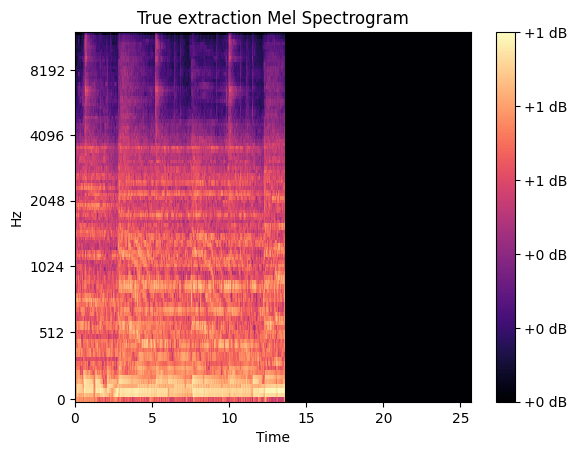

In [ ]:
%matplotlib inline
for i, file_name in enumerate(filelist):
  # load the mel spectrogram in .npy format
  x = np.load(os.path.join(save_path, file_name))
  print(x.shape)
  break


assert x.ndim == 2
assert np.float32(x).dtype == np.float32
 # Display the spectrogram
librosa.display.specshow(np.float32(x), x_axis='time', y_axis='mel', sr=h.sampling_rate)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction Mel Spectrogram')
plt.show()



# Building training and validation sets

In [ ]:
import math
MAX_SPEC = 0
filenames = np.sort(os.listdir(save_path_prueba))
for f in filenames:
  max_aux = np.max(np.abs(np.load(os.path.join(save_path_prueba, f), allow_pickle=True)))*MAX_WAV_VALUE
  if max_aux > MAX_SPEC:
    MAX_SPEC = max_aux
        



In [ ]:
MAX_SPEC

377255.53125

In [ ]:
def norm(signal):
    signal = signal*MAX_WAV_VALUE
    signal = librosa.amplitude_to_db((signal+MAX_SPEC))/(20*math.log10(2*MAX_SPEC))
    return signal

In [ ]:
from numpy.core.fromnumeric import size

batch_size = 6
# Set up train and validation data loaders
X = []
y_drums = []
y_vocals = []
y_bass = []

filenames = np.sort(os.listdir(save_path_prueba))
for f in filenames:
  #print(f)
  if 'mix' in f:
    print(f)
    X.append(norm(np.load(os.path.join(save_path_prueba, f), allow_pickle=True)))
  if 'vocals' in f:
    print(f)
    y_vocals.append(norm(np.load(os.path.join(save_path_prueba, f), allow_pickle=True)))
  if 'drums' in f:
    print(f)
    y_drums.append(norm(np.load(os.path.join(save_path_prueba, f), allow_pickle=True)))
  if 'bass' in f:
    print(f)
    y_bass.append(norm(np.load(os.path.join(save_path_prueba, f), allow_pickle=True)))


# AQUI ME FALTA CHEQUEAR EL TAMAÑO QQUE NO LO SE BIEN
X = [i[np.newaxis, :, :592].astype('float32') for i in X]
y_vocals = [i[np.newaxis, :, :592].astype('float32') for i in y_vocals]
y_drums = [i[np.newaxis, :, :592].astype('float32') for i in y_drums]
y_bass = [i[np.newaxis, :, :592].astype('float32') for i in y_bass]


X_train_vocals, X_test_vocals, y_train_vocals, y_test_vocals = train_test_split(X, y_vocals, test_size=0.1, random_state=42)
X_train_drums, X_test_drums, y_train_drums, y_test_drums = train_test_split(X, y_drums, test_size=0.1, random_state=42)
X_train_bass, X_test_bass, y_train_bass, y_test_bass = train_test_split(X, y_bass, test_size=0.1, random_state=42)


10_bass.npy
10_drums.npy
10_mix.npy
10_vocals.npy
11_bass.npy
11_drums.npy
11_mix.npy
11_vocals.npy
12_bass.npy
12_drums.npy
12_mix.npy
12_vocals.npy
13_bass.npy
13_drums.npy
13_mix.npy
13_vocals.npy
14_bass.npy
14_drums.npy
14_mix.npy
14_vocals.npy
15_bass.npy
15_drums.npy
15_mix.npy
15_vocals.npy
16_bass.npy
16_drums.npy
16_mix.npy
16_vocals.npy
17_bass.npy
17_drums.npy
17_mix.npy
17_vocals.npy
18_bass.npy
18_drums.npy
18_mix.npy
18_vocals.npy
19_bass.npy
19_drums.npy
19_mix.npy
19_vocals.npy
1_bass.npy
1_drums.npy
1_mix.npy
1_vocals.npy
20_bass.npy
20_drums.npy
20_mix.npy
20_vocals.npy
21_bass.npy
21_drums.npy
21_mix.npy
21_vocals.npy
22_bass.npy
22_drums.npy
22_mix.npy
22_vocals.npy
23_bass.npy
23_drums.npy
23_mix.npy
23_vocals.npy
24_bass.npy
24_drums.npy
24_mix.npy
24_vocals.npy
25_bass.npy
25_drums.npy
25_mix.npy
25_vocals.npy
26_bass.npy
26_drums.npy
26_mix.npy
26_vocals.npy
27_bass.npy
27_drums.npy
27_mix.npy
27_vocals.npy
28_bass.npy
28_drums.npy
28_mix.npy
28_vocals.npy
29_b

In [ ]:
X[5].shape

(1, 100, 592)

In [ ]:
from torch.utils.data import Dataset, DataLoader

class MyDataset(Dataset):
    def __init__(self, x_train, y_train):
        self.x = x_train
        self.y = y_train
        
    def __len__(self):
        return len(self.x)
    
    def __getitem__(self, idx):
        x = self.x[idx]
        y = self.y[idx]
        return x, y

#Encoder-Decoder

## Encoder

Use the following cell to define the varibale size of the last linear layer of the encoder.

First, execute the next cell

In [ ]:
out_size_len = 0

In [ ]:
#! We extend the nn.Module of Pytorch
class Encoder(nn.Module):
    def __init__(self, latent_dim):
        super(Encoder, self).__init__()

        # define convolutional layers for encoding
        #! in_channels is 1 because the spectogram is only 1 channel
        #! batch normalization is meant to improve the training quality
        #! take into account the output channels of each layer must coincide with the input channels of the following layer
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=512, kernel_size=(5, 5), stride=(2, 2))
        self.batch1 = nn.BatchNorm2d(512)
        self.conv2 = nn.Conv2d(in_channels=512, out_channels=256, kernel_size=(3, 3), stride=(2, 2))
        self.batch2 = nn.BatchNorm2d(256)
        self.conv3 = nn.Conv2d(in_channels=256, out_channels=128, kernel_size=(3, 3), stride=(2, 2))
        self.batch3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=(2, 2), stride=(2, 2))
        self.batch4 = nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=(1, 1), stride=(1, 1))

        # define latent space
        self.z = nn.Linear(out_size_len , latent_dim)

    def forward(self, x):
        x = x.to(device)  # move input to GPU
        x = F.relu(self.batch1(self.conv1(x)))  # apply convolutional layer, batch norm, and ReLU activation
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.batch3(self.conv3(x)))
        x = F.relu(self.batch4(self.conv4(x)))
        x = F.relu(self.conv5(x))
        x = torch.flatten(x, start_dim=1)  # flatten output for linear layers
        
        z = F.relu(self.z(x))
        
        return z

    # ! This is the exercise below
    def get_output_size(self, input_shape):
        x = torch.zeros(input_shape)
        x = x.to(device)
        x = self.conv1(x)
        x = self.batch1(x)
        x = self.conv2(x)
        x = self.batch2(x)
        x = self.conv3(x)
        x = self.batch3(x)
        x = self.conv4(x)
        x = self.batch4(x)
        x = self.conv5(x)
        output_size = x.size()[1:]
        return output_size
        
      
        
        

Now, run the next cell and following, re-run the Encoder cell, so as its output size is correctly defined

In [ ]:
# Test
e = Encoder(20)
e.to(device)
out_size = np.array(e.get_output_size([6, 1, 100, 592]))
out_size_len = np.prod(out_size)
print(out_size)

/usr/local/lib/python3.10/dist-packages/torch/nn/init.py:405: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


[32  5 36]


## Decoder

In [ ]:
class Decoder(nn.Module):

    def __init__(self, latent_dims):
        super().__init__()

        # linear layer to map latent code to 3D tensor
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 128),
            nn.ReLU(True),
            #! The next is the size obtained by the get_output_size
            nn.Linear(128, out_size_len),
            nn.ReLU(True)
        )

        # unflatten 3D tensor to 4D tensor
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(int(out_size[0]), int(out_size[1]), int(out_size[2])))

        # transposed convolutional layers to gradually increase spatial resolution
        self.dec1 = nn.ConvTranspose2d(in_channels=32, out_channels=64, kernel_size=(1, 1), stride=(1, 1))
        self.batch1 = nn.BatchNorm2d(64)
        self.dec2 = nn.ConvTranspose2d(in_channels=64, out_channels=128, kernel_size=(2, 2), stride=(2, 2), output_padding=1)
        self.batch2 = nn.BatchNorm2d(128)
        self.dec3 = nn.ConvTranspose2d(in_channels=128, out_channels=256, kernel_size=(3, 3), stride=(2, 2), output_padding=(1,0))
        self.batch3 = nn.BatchNorm2d(256)
        self.dec4 = nn.ConvTranspose2d(in_channels=256, out_channels=512, kernel_size=(3, 3), stride=(2, 2))
        self.batch4 = nn.BatchNorm2d(512)
        self.dec5 = nn.ConvTranspose2d(in_channels=512, out_channels=1, kernel_size=(3, 3), stride=(2, 2), output_padding=1)

    def forward(self, x):
        # linear layer to map latent code to 3D tensor
        x = self.decoder_lin(x)
        # unflatten 3D tensor to 4D tensor
        x = self.unflatten(x)
        # transposed convolutional layers to gradually increase spatial resolution
        x = F.relu(self.batch1(self.dec1(x)))
        x = F.relu(self.batch2(self.dec2(x)))
        x = F.relu(self.batch3(self.dec3(x)))
        x = F.relu(self.batch4(self.dec4(x)))
        x = self.dec5(x)
        # apply sigmoid activation function to ensure output is between 0 and 1
        x = torch.sigmoid(x)
        return x


## Encoder-Decoder

In [ ]:
class Enc_Dec(nn.Module):
    def __init__(self, latent_dims):
        super(Enc_Dec, self).__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device) 
        z = self.encoder(x)
        return self.decoder(z)

We use `torchsummary` to check the shape of the output is same shape as the input.

It delivers a detailed evolution of the shape along the layers

In [ ]:
from torchsummary import summary
summary(Enc_Dec(latent_dims=20).to(device), X[0].shape)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 512, 48, 294]          13,312
       BatchNorm2d-2         [-1, 512, 48, 294]           1,024
            Conv2d-3         [-1, 256, 23, 146]       1,179,904
       BatchNorm2d-4         [-1, 256, 23, 146]             512
            Conv2d-5          [-1, 128, 11, 72]         295,040
       BatchNorm2d-6          [-1, 128, 11, 72]             256
            Conv2d-7            [-1, 64, 5, 36]          32,832
       BatchNorm2d-8            [-1, 64, 5, 36]             128
            Conv2d-9            [-1, 32, 5, 36]           2,080
           Linear-10                   [-1, 20]         115,220
          Encoder-11                   [-1, 20]               0
           Linear-12                  [-1, 128]           2,688
             ReLU-13                  [-1, 128]               0
           Linear-14                 [-

In [ ]:
x = torch.randn(6, 1, 100, 592)  # example input tensor
x.to(device)
encoder = Encoder(latent_dim=20)
encoder.to(device)
decoder = Decoder(latent_dims=20)
decoder.to(device)

# forward pass
z = encoder(x)
x_hat = decoder(z)

# print shapes
print('input:', x.shape)
print('output of encoder:', z.shape)
print('output of decoder linear layer:', decoder.decoder_lin(z).shape)
print('output:', x_hat.shape)

input: torch.Size([6, 1, 100, 592])
output of encoder: torch.Size([6, 20])
output of decoder linear layer: torch.Size([6, 5760])
output: torch.Size([6, 1, 100, 592])


In [ ]:
model = Enc_Dec(latent_dims=20) # Deberíamos poner = 2?? Por qué 2??

#U-Net

In [ ]:
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        self.upconv6 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.upconv7 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2, output_padding=(1,0))
        self.conv7 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.upconv8 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.upconv9 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(128, 64,kernel_size=3,padding=1)
        self.conv10 = nn.Conv2d(64 ,1,kernel_size=1)

    def forward(self,x):
        conv1_out = F.relu(self.conv1(x))
        conv1_out_pool = F.max_pool2d(conv1_out,kernel_size=(2))
        
        conv2_out = F.relu(self.conv2(conv1_out_pool))
        conv2_out_pool = F.max_pool2d(conv2_out,kernel_size=(2))
        
        conv3_out = F.relu(self.conv3(conv2_out_pool))
        conv3_out_pool = F.max_pool2d(conv3_out,kernel_size=(2))
        
        conv4_out = F.relu(self.conv4(conv3_out_pool))
        conv4_out_pool = F.max_pool2d(conv4_out,kernel_size=(2))
        
        conv5_out = F.relu(self.conv5(conv4_out_pool))
        
        upconv6_out = F.relu(self.upconv6(conv5_out))
        
        
        merge6_out = torch.cat([upconv6_out , conv4_out], dim=1)
        
        conv6_out = F.relu(self.conv6(merge6_out))
        
        upconv7_out = F.relu(self.upconv7(conv6_out))

        
        merge7_out = torch.cat([upconv7_out , conv3_out], dim=1)
        
        conv7_out = F.relu(self.conv7(merge7_out))
        
        upconv8_out = F.relu(self.upconv8(conv7_out))
        
        merge8_out = torch.cat([upconv8_out , conv2_out], dim=1)
        
        conv8_out = F.relu(self.conv8(merge8_out))
        
        upconv9_out = F.relu(self.upconv9(conv8_out))
        
        merge9_out = torch.cat([upconv9_out , conv1_out], dim=1)
        
        conv9_out = F.relu(self.conv9(merge9_out))

        out=self.conv10(conv9_out)

        return out

In [ ]:
model = UNet()

#Transformer

In [ ]:


# Define the self-attention block
class SelfAttentionBlock(nn.Module):
    def __init__(self, in_channels):
        super(SelfAttentionBlock, self).__init__()
        
        self.query_conv = nn.Conv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
    def forward(self, x):
        batch_size, C, H, W = x.size()
        proj_query = self.query_conv(x).view(batch_size, -1, H * W).permute(0, 2, 1)
        proj_key = self.key_conv(x).view(batch_size, -1, H * W)
        energy = torch.bmm(proj_query, proj_key)
        attention = F.softmax(energy, dim=-1)
        proj_value = self.value_conv(x).view(batch_size, -1, H * W)
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(batch_size, C, H, W)
        out = self.gamma * out + x
        return out

# Define the self-attention U-Net
class SelfAttentionUNet(nn.Module):
    def __init__(self, num_classes=2):
        super(SelfAttentionUNet, self).__init__()
        
        # Define the encoder
        self.encoder1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SelfAttentionBlock(64),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.encoder2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            SelfAttentionBlock(128),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.encoder3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            SelfAttentionBlock(256),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.encoder4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            SelfAttentionBlock(512),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        # Define the decoder
        self.decoder4 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            SelfAttentionBlock(256)
        )
       
        self.decoder3 = nn.Sequential(
            nn.ConvTranspose2d(256 + 512, 128, kernel_size=2, stride=2),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            SelfAttentionBlock(128)
        )
        self.decoder2 = nn.Sequential(
            nn.ConvTranspose2d(128 + 256, 64, kernel_size=2, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SelfAttentionBlock(64)
        )
        self.decoder1 = nn.Sequential(
            nn.ConvTranspose2d(64 + 128, 64, kernel_size=2, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SelfAttentionBlock(64),
            nn.Conv2d(64, num_classes, kernel_size=1)
        )
        
    def forward(self, x):
        # Encode
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        
        # Decode
        dec4 = self.decoder4(enc4)
        dec3 = self.decoder3(torch.cat([dec4, enc3], dim=1))
        dec2 = self.decoder2(torch.cat([dec3, enc2], dim=1))
        dec1 = self.decoder1(torch.cat([dec2, enc1], dim=1))
        
        return dec1



In [ ]:
model = SelfAttentionUNet(num_classes=2)

# optimUs-priNET

In [ ]:
def patchify(images, n_patches):
    n, c, h, w = images.shape

    assert h == w, "Patchify method is implemented for square images only"

    patches = torch.zeros(n, n_patches ** 2, h * w * c // n_patches ** 2)
    patch_size = h // n_patches

    for idx, image in enumerate(images):
        for i in range(n_patches):
            for j in range(n_patches):
                patch = image[:, i * patch_size: (i + 1) * patch_size, j * patch_size: (j + 1) * patch_size]
                patches[idx, i * n_patches + j] = patch.flatten()
    return patches

In [ ]:
class Norm(nn.Module):
    def __init__(self, d_model, eps = 1e-6):
        super().__init__()
    
        self.size = d_model
        # create two learnable parameters to calibrate normalisation
        self.alpha = nn.Parameter(torch.ones(self.size))
        self.bias = nn.Parameter(torch.zeros(self.size))
        self.eps = eps
    def forward(self, x):
        norm = self.alpha * (x - x.mean(dim=-1, keepdim=True)) \
        / (x.std(dim=-1, keepdim=True) + self.eps) + self.bias
        return norm

In [ ]:
def get_positional_embeddings(sequence_length, d):
    result = torch.ones(sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[i][j] = np.sin(i / (10000 ** (j / d))) if j % 2 == 0 else np.cos(i / (10000 ** ((j - 1) / d)))
    return result


In [ ]:
class MyMSA(nn.Module):
    def __init__(self, d, n_heads=2):
        super(MyMSA, self).__init__()
        self.d = d
        self.n_heads = n_heads

        assert d % n_heads == 0, f"Can't divide dimension {d} into {n_heads} heads"

        d_head = int(d / n_heads)
        self.q_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.k_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.v_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.d_head = d_head
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, sequences):
        # Sequences has shape (N, seq_length, token_dim)
        # We go into shape    (N, seq_length, n_heads, token_dim / n_heads)
        # And come back to    (N, seq_length, item_dim)  (through concatenation)
        result = []
        for sequence in sequences:
            seq_result = []
            for head in range(self.n_heads):
                q_mapping = self.q_mappings[head]
                k_mapping = self.k_mappings[head]
                v_mapping = self.v_mappings[head]

                seq = sequence[:, head * self.d_head: (head + 1) * self.d_head]
                q, k, v = q_mapping(seq), k_mapping(seq), v_mapping(seq)

                #attention = self.softmax(q @ k.T / (self.d_head ** 0.5))
                attention = self.softmax(q @ k.permute(0, 2, 1) / (self.d_head ** 0.5))

                seq_result.append(attention @ v)
            result.append(torch.hstack(seq_result))
        return torch.cat([torch.unsqueeze(r, dim=0) for r in result])

In [ ]:
class MyViTBlock(nn.Module):
    def __init__(self, hidden_d, n_heads,dropout = 0.1, mlp_ratio=4):
        super(MyViTBlock, self).__init__()
        self.hidden_d = hidden_d
        self.n_heads = n_heads

        self.norm1 = nn.LayerNorm(hidden_d)
        self.mhsa = MyMSA(hidden_d, n_heads)
        #self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, dropout=dropout,device=None )
        self.norm2 = nn.LayerNorm(hidden_d)
        self.mlp = nn.Sequential(
            nn.Linear(hidden_d, mlp_ratio * hidden_d),
            nn.GELU(),
            nn.Linear(mlp_ratio * hidden_d, hidden_d)
        )
        #self.ff = FeedForward(d_model)
        self.dropout_1 = nn.Dropout(dropout)
        self.dropout_2 = nn.Dropout(dropout)

    def forward(self, x):
      
        out = x + self.mhsa(self.norm1(x))
        out = out + self.mlp(self.norm2(out))

        return out

In [ ]:
class MyViT(nn.Module):
    #def __init__(self, chw, n_patches=7, n_blocks=2, hidden_d=8, n_heads=2, out_d=10):
    def __init__(self, n_blocks, hidden_d, n_heads, out_d):
        # Super constructor
        super(MyViT, self).__init__()
        
        # Attributes
        #self.chw = chw # ( C , H , W )
        #self.n_patches = n_patches
        self.n_blocks = n_blocks
        self.n_heads = n_heads
        self.hidden_d = hidden_d
        
        """# Input and patches sizes
        assert chw[1] % n_patches == 0, "Input shape not entirely divisible by number of patches"
        assert chw[2] % n_patches == 0, "Input shape not entirely divisible by number of patches"
        self.patch_size = (chw[1] / n_patches, chw[2] / n_patches)
        """
        """# 1) Linear mapper
        self.input_d = int(chw[0] * self.patch_size[0] * self.patch_size[1])
        self.linear_mapper = nn.Linear(self.input_d, self.hidden_d)
        
        # 2) Learnable classification token
        self.class_token = nn.Parameter(torch.rand(1, self.hidden_d))
        
        # 3) Positional embedding
        self.register_buffer('positional_embeddings', get_positional_embeddings(n_patches ** 2 + 1, hidden_d), persistent=False)
        """
        # 4) Transformer encoder blocks
        self.blocks = nn.ModuleList([MyViTBlock(hidden_d, n_heads) for _ in range(n_blocks)])

    def forward(self, out):
        # Dividing images into patches
        """n, c, h, w = images.shape
        patches = patchify(images, self.n_patches).to(self.positional_embeddings.device)
        
        # Running linear layer tokenization
        # Map the vector corresponding to each patch to the hidden size dimension
        tokens = self.linear_mapper(patches)
        
        # Adding classification token to the tokens
        tokens = torch.cat((self.class_token.expand(n, 1, -1), tokens), dim=1)
        
        # Adding positional embedding
        out = tokens + self.positional_embeddings.repeat(n, 1, 1)
        """
        # Transformer Blocks
        for block in self.blocks:
            out = block(out)
            
        return out

In [ ]:
import torch.nn as nn
#import torch.nn.MultiheadAttention

class optimUs_priNET(nn.Module):
    def __init__(self):
        super(optimUs_priNET, self).__init__()
        #Down-sampling
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(512, 1024, kernel_size=3, padding=1)
        

        self.transf = MyViT(n_blocks=2, hidden_d=1024, n_heads=2, out_d=10).to(device)


        #Up-sampling
        self.upconv6 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.upconv7 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2, output_padding=(1,0))
        self.conv7 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.upconv8 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.upconv9 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(128, 64,kernel_size=3,padding=1)
        self.conv10 = nn.Conv2d(64 ,1,kernel_size=1)

    def forward(self,x):
        conv1_out = F.relu(self.conv1(x))
        conv1_out_pool = F.max_pool2d(conv1_out,kernel_size=(2))
        
        conv2_out = F.relu(self.conv2(conv1_out_pool))
        conv2_out_pool = F.max_pool2d(conv2_out,kernel_size=(2))
        
        conv3_out = F.relu(self.conv3(conv2_out_pool))
        conv3_out_pool = F.max_pool2d(conv3_out,kernel_size=(2))
        
        conv4_out = F.relu(self.conv4(conv3_out_pool))
        conv4_out_pool = F.max_pool2d(conv4_out,kernel_size=(2))
        
        conv5_out = F.relu(self.conv5(conv4_out_pool))

        print(conv5_out.shape)
        transf_out = F.relu(self.transf(conv5_out))
        
        upconv6_out = F.relu(self.upconv6(transf_out))
        merge6_out = torch.cat([upconv6_out , conv4_out], dim=1)
        conv6_out = F.relu(self.conv6(merge6_out))
        
        upconv7_out = F.relu(self.upconv7(conv6_out))
        merge7_out = torch.cat([upconv7_out , conv3_out], dim=1)
        conv7_out = F.relu(self.conv7(merge7_out))
        
        upconv8_out = F.relu(self.upconv8(conv7_out))
        merge8_out = torch.cat([upconv8_out , conv2_out], dim=1)
        conv8_out = F.relu(self.conv8(merge8_out))
        
        upconv9_out = F.relu(self.upconv9(conv8_out))
        merge9_out = torch.cat([upconv9_out , conv1_out], dim=1)
        conv9_out = F.relu(self.conv9(merge9_out))

        out=self.conv10(conv9_out)

        return out

In [ ]:
model = optimUs_priNET()

# Training

In [ ]:
X_train_vocals[1]

array([[[0.92643195, 0.93105876, 0.9292275 , ..., 0.9269952 ,
         0.9292873 , 0.9294562 ],
        [0.92404014, 0.92998105, 0.927699  , ..., 0.92830104,
         0.9266835 , 0.9286479 ],
        [0.9311958 , 0.9340053 , 0.92489535, ..., 0.93142176,
         0.92888093, 0.9290881 ],
        ...,
        [0.86277485, 0.86072946, 0.85783803, ..., 0.87529397,
         0.8709644 , 0.869866  ],
        [0.86255777, 0.84496266, 0.8375016 , ..., 0.850195  ,
         0.8483436 , 0.8426007 ],
        [0.86331457, 0.81618696, 0.72301054, ..., 0.7693598 ,
         0.77274805, 0.7550025 ]]], dtype=float32)

In [ ]:
# Set hyperparameters
lr = 1e-4
beta = 0.00001
num_epochs = 800
batch_size = 6

In [ ]:
# Set up optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
# Set up device
model.to(device)

UNet(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (upconv6): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
  (conv6): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (upconv7): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2), output_padding=(1, 0))
  (conv7): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (upconv8): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
  (conv8): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (upconv9): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
  (conv9): Conv2d(128, 64, kernel_size=(3, 3)

In [ ]:
# Create an instance of the dataset for training and test for each of the possible extracted instruments
###########Vocals
train_dataset_vocals = MyDataset(X_train_vocals, y_train_vocals)
test_dataset_vocals = MyDataset(X_test_vocals, y_test_vocals)
# Create data loaders
train_loader_vocals = DataLoader(train_dataset_vocals, batch_size=batch_size, shuffle=True)
valid_loader_vocals = DataLoader(test_dataset_vocals, batch_size=batch_size, shuffle=True)


##########Drums
train_dataset_drums = MyDataset(X_train_drums, y_train_drums)
test_dataset_drums = MyDataset(X_test_drums, y_test_drums)
# Create data loaders
train_loader_drums = DataLoader(train_dataset_drums, batch_size=batch_size, shuffle=True)
valid_loader_drums = DataLoader(test_dataset_drums, batch_size=batch_size, shuffle=True)


##########Bass
train_dataset_bass = MyDataset(X_train_bass, y_train_bass)
test_dataset_bass = MyDataset(X_test_bass, y_test_bass)
# Create data loaders
train_loader_bass = DataLoader(train_dataset_bass, batch_size=batch_size, shuffle=True)
valid_loader_bass = DataLoader(test_dataset_bass, batch_size=batch_size, shuffle=True)

In [ ]:
# Define training and validation loops
def train_epoch(model, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    model.train()
    train_loss = 0.0
    reconstruction_error_epoch = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x, y in tqdm(dataloader):
        # Move tensor to the proper device       
        x = x.to(device)      
        model.zero_grad()
        output = model(x)
        y = y.to(device)

        # Evaluate loss
        loss = ((torch.abs(output - y)) ** 2).sum()
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Update loss values
        train_loss += loss.item()

    # Compute mean loss values
    return train_loss / len(dataloader.dataset)


def test_epoch(model, device, dataloader):
    # Set evaluation mode for encoder and decoder
    model.eval()
    val_loss = 0.0
    with torch.no_grad(): # No need to track the gradients
        for x, y in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            y = y.to(device)
            # Decode data
            output = model(x)
            # loss = ((x - x_hat)**2).sum() + vae.encoder.kl
            loss = ((torch.abs(output - y)) ** 2).sum()
            val_loss += loss.item()

    return val_loss / len(dataloader.dataset)

In [ ]:
X[0].shape

(1, 100, 592)

In [ ]:
def denorm(signal):
    signal = librosa.db_to_amplitude(signal*20*math.log10(2*MAX_SPEC))
    signal = signal - MAX_SPEC
    signal = signal/MAX_WAV_VALUE
    return signal

In [ ]:
denorm(y[0])

array([[[-1.8377743e+00, -1.7604294e+00, -1.7671938e+00, ...,
          3.4654427e-01,  2.1942806e-01,  9.4413757e-05],
        [-6.7070580e-01, -7.1144962e-01, -6.7891693e-01, ...,
          7.5774288e-01,  4.1989708e-01, -1.9066334e-01],
        [-6.6695595e-01, -1.0237570e+00, -7.0287132e-01, ...,
         -7.7012444e-01, -1.0073214e+00, -2.1153803e+00],
        ...,
        [-6.0254831e+00, -5.7941966e+00, -5.7292962e+00, ...,
         -6.1263900e+00, -6.5024900e+00, -6.3394952e+00],
        [-6.0922222e+00, -6.7035313e+00, -6.8870630e+00, ...,
         -6.9498367e+00, -7.2495956e+00, -7.4904823e+00],
        [-6.2398367e+00, -7.9339185e+00, -9.3217154e+00, ...,
         -9.1453648e+00, -9.3396416e+00, -9.5266514e+00]]], dtype=float32)

## Voice

In [ ]:
train_history = []
val_history = []

for epoch in range(num_epochs):
   train_loss = train_epoch(model, device, train_loader_vocals, optimizer)
   val_loss = test_epoch(model, device, valid_loader_vocals)
   print('\n EPOCH %1.0f/%2.0f \t train loss: %.3f \t val loss: %.3f'%(epoch + 1, num_epochs, train_loss, val_loss))
   train_history.append(train_loss)
   val_history.append(val_loss)

100%|██████████| 14/14 [00:01<00:00,  7.11it/s]



 EPOCH 1/800 	 train loss: 13110.427 	 val loss: 1892.593


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 2/800 	 train loss: 6248.634 	 val loss: 887.631


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 3/800 	 train loss: 2818.614 	 val loss: 715.862


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 4/800 	 train loss: 2217.112 	 val loss: 692.774


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 5/800 	 train loss: 1823.105 	 val loss: 621.651


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 6/800 	 train loss: 1708.327 	 val loss: 568.207


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 7/800 	 train loss: 1544.403 	 val loss: 610.098


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 8/800 	 train loss: 1426.919 	 val loss: 900.841


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 9/800 	 train loss: 1559.866 	 val loss: 966.689


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 10/800 	 train loss: 1061.806 	 val loss: 933.949


100%|██████████| 14/14 [00:01<00:00,  7.32it/s]



 EPOCH 11/800 	 train loss: 1089.178 	 val loss: 976.527


100%|██████████| 14/14 [00:01<00:00,  7.32it/s]



 EPOCH 12/800 	 train loss: 977.539 	 val loss: 769.700


100%|██████████| 14/14 [00:01<00:00,  7.31it/s]



 EPOCH 13/800 	 train loss: 914.784 	 val loss: 731.072


100%|██████████| 14/14 [00:01<00:00,  7.32it/s]



 EPOCH 14/800 	 train loss: 789.207 	 val loss: 739.922


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 15/800 	 train loss: 607.095 	 val loss: 684.359


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 16/800 	 train loss: 641.767 	 val loss: 693.306


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 17/800 	 train loss: 627.931 	 val loss: 653.743


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 18/800 	 train loss: 567.553 	 val loss: 614.692


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 19/800 	 train loss: 525.304 	 val loss: 622.979


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 20/800 	 train loss: 447.487 	 val loss: 589.753


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 21/800 	 train loss: 417.688 	 val loss: 586.005


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 22/800 	 train loss: 443.235 	 val loss: 590.858


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 23/800 	 train loss: 403.935 	 val loss: 991.000


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 24/800 	 train loss: 527.442 	 val loss: 611.343


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 25/800 	 train loss: 523.052 	 val loss: 668.210


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 26/800 	 train loss: 479.157 	 val loss: 589.143


100%|██████████| 14/14 [00:01<00:00,  7.49it/s]



 EPOCH 27/800 	 train loss: 419.190 	 val loss: 581.203


100%|██████████| 14/14 [00:01<00:00,  7.51it/s]



 EPOCH 28/800 	 train loss: 384.556 	 val loss: 579.018


100%|██████████| 14/14 [00:01<00:00,  7.51it/s]



 EPOCH 29/800 	 train loss: 418.661 	 val loss: 576.479


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 30/800 	 train loss: 462.409 	 val loss: 560.590


100%|██████████| 14/14 [00:01<00:00,  7.51it/s]



 EPOCH 31/800 	 train loss: 451.639 	 val loss: 566.930


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 32/800 	 train loss: 376.448 	 val loss: 564.907


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 33/800 	 train loss: 368.275 	 val loss: 667.043


100%|██████████| 14/14 [00:01<00:00,  7.50it/s]



 EPOCH 34/800 	 train loss: 381.804 	 val loss: 558.513


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 35/800 	 train loss: 371.860 	 val loss: 714.420


100%|██████████| 14/14 [00:01<00:00,  7.53it/s]



 EPOCH 36/800 	 train loss: 336.198 	 val loss: 544.013


100%|██████████| 14/14 [00:01<00:00,  7.52it/s]



 EPOCH 37/800 	 train loss: 313.568 	 val loss: 509.390


100%|██████████| 14/14 [00:01<00:00,  7.50it/s]



 EPOCH 38/800 	 train loss: 277.569 	 val loss: 487.819


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 39/800 	 train loss: 231.128 	 val loss: 481.539


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 40/800 	 train loss: 209.206 	 val loss: 472.777


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 41/800 	 train loss: 199.823 	 val loss: 468.418


100%|██████████| 14/14 [00:01<00:00,  7.50it/s]



 EPOCH 42/800 	 train loss: 181.408 	 val loss: 467.309


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 43/800 	 train loss: 217.127 	 val loss: 477.774


100%|██████████| 14/14 [00:01<00:00,  7.50it/s]



 EPOCH 44/800 	 train loss: 178.274 	 val loss: 472.544


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 45/800 	 train loss: 176.771 	 val loss: 467.897


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 46/800 	 train loss: 181.673 	 val loss: 468.009


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 47/800 	 train loss: 190.776 	 val loss: 469.481


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 48/800 	 train loss: 190.655 	 val loss: 468.032


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 49/800 	 train loss: 184.121 	 val loss: 463.778


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 50/800 	 train loss: 186.297 	 val loss: 466.552


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 51/800 	 train loss: 176.606 	 val loss: 463.137


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 52/800 	 train loss: 178.682 	 val loss: 468.222


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 53/800 	 train loss: 179.907 	 val loss: 464.936


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 54/800 	 train loss: 178.607 	 val loss: 463.173


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 55/800 	 train loss: 175.741 	 val loss: 462.606


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 56/800 	 train loss: 185.937 	 val loss: 466.936


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 57/800 	 train loss: 200.883 	 val loss: 461.852


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 58/800 	 train loss: 200.185 	 val loss: 473.344


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 59/800 	 train loss: 179.939 	 val loss: 470.675


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 60/800 	 train loss: 176.146 	 val loss: 466.323


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 61/800 	 train loss: 178.987 	 val loss: 463.027


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 62/800 	 train loss: 167.530 	 val loss: 461.925


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 63/800 	 train loss: 175.454 	 val loss: 458.425


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 64/800 	 train loss: 189.355 	 val loss: 459.708


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 65/800 	 train loss: 181.166 	 val loss: 462.003


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 66/800 	 train loss: 174.258 	 val loss: 460.356


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 67/800 	 train loss: 172.275 	 val loss: 463.180


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 68/800 	 train loss: 172.627 	 val loss: 456.936


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 69/800 	 train loss: 167.770 	 val loss: 457.036


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 70/800 	 train loss: 168.660 	 val loss: 455.998


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 71/800 	 train loss: 165.262 	 val loss: 461.681


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 72/800 	 train loss: 167.069 	 val loss: 455.651


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 73/800 	 train loss: 171.185 	 val loss: 467.419


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 74/800 	 train loss: 185.307 	 val loss: 472.641


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 75/800 	 train loss: 168.768 	 val loss: 461.556


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 76/800 	 train loss: 163.182 	 val loss: 459.622


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 77/800 	 train loss: 162.176 	 val loss: 469.939


100%|██████████| 14/14 [00:01<00:00,  7.49it/s]



 EPOCH 78/800 	 train loss: 158.651 	 val loss: 463.101


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 79/800 	 train loss: 167.696 	 val loss: 456.873


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 80/800 	 train loss: 165.340 	 val loss: 618.201


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 81/800 	 train loss: 168.097 	 val loss: 502.679


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 82/800 	 train loss: 171.649 	 val loss: 504.065


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 83/800 	 train loss: 167.568 	 val loss: 442.128


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 84/800 	 train loss: 174.438 	 val loss: 444.081


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 85/800 	 train loss: 169.718 	 val loss: 458.010


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 86/800 	 train loss: 166.697 	 val loss: 454.066


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 87/800 	 train loss: 165.353 	 val loss: 459.027


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 88/800 	 train loss: 160.861 	 val loss: 454.605


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 89/800 	 train loss: 161.536 	 val loss: 452.673


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 90/800 	 train loss: 163.077 	 val loss: 454.857


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 91/800 	 train loss: 160.359 	 val loss: 451.831


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 92/800 	 train loss: 162.355 	 val loss: 454.435


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 93/800 	 train loss: 153.766 	 val loss: 455.868


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 94/800 	 train loss: 154.228 	 val loss: 456.343


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 95/800 	 train loss: 157.943 	 val loss: 460.737


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 96/800 	 train loss: 157.924 	 val loss: 456.743


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 97/800 	 train loss: 153.183 	 val loss: 454.291


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 98/800 	 train loss: 159.643 	 val loss: 451.489


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 99/800 	 train loss: 162.276 	 val loss: 492.041


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 100/800 	 train loss: 159.733 	 val loss: 459.104


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 101/800 	 train loss: 159.178 	 val loss: 451.488


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 102/800 	 train loss: 155.616 	 val loss: 453.335


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 103/800 	 train loss: 155.956 	 val loss: 450.789


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 104/800 	 train loss: 152.421 	 val loss: 451.767


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 105/800 	 train loss: 160.661 	 val loss: 452.282


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 106/800 	 train loss: 156.681 	 val loss: 461.434


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 107/800 	 train loss: 159.172 	 val loss: 458.599


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 108/800 	 train loss: 152.454 	 val loss: 453.363


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 109/800 	 train loss: 157.695 	 val loss: 451.964


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 110/800 	 train loss: 160.333 	 val loss: 462.706


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 111/800 	 train loss: 149.190 	 val loss: 451.507


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 112/800 	 train loss: 149.354 	 val loss: 449.830


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 113/800 	 train loss: 160.468 	 val loss: 455.416


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 114/800 	 train loss: 162.080 	 val loss: 454.248


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 115/800 	 train loss: 148.652 	 val loss: 451.125


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 116/800 	 train loss: 149.342 	 val loss: 447.733


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 117/800 	 train loss: 149.596 	 val loss: 450.031


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 118/800 	 train loss: 152.875 	 val loss: 449.697


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 119/800 	 train loss: 148.661 	 val loss: 446.441


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 120/800 	 train loss: 147.350 	 val loss: 447.785


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 121/800 	 train loss: 144.189 	 val loss: 446.336


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 122/800 	 train loss: 149.874 	 val loss: 451.209


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 123/800 	 train loss: 155.730 	 val loss: 447.956


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 124/800 	 train loss: 154.157 	 val loss: 446.710


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 125/800 	 train loss: 151.851 	 val loss: 448.982


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 126/800 	 train loss: 156.077 	 val loss: 450.521


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 127/800 	 train loss: 158.725 	 val loss: 451.613


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 128/800 	 train loss: 154.317 	 val loss: 449.541


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 129/800 	 train loss: 151.137 	 val loss: 449.898


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 130/800 	 train loss: 154.058 	 val loss: 451.292


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 131/800 	 train loss: 157.267 	 val loss: 451.470


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 132/800 	 train loss: 155.394 	 val loss: 451.671


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 133/800 	 train loss: 153.317 	 val loss: 448.583


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 134/800 	 train loss: 149.167 	 val loss: 448.184


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 135/800 	 train loss: 146.350 	 val loss: 446.659


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 136/800 	 train loss: 147.777 	 val loss: 449.123


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 137/800 	 train loss: 145.836 	 val loss: 446.946


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 138/800 	 train loss: 147.474 	 val loss: 444.985


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 139/800 	 train loss: 147.626 	 val loss: 449.026


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 140/800 	 train loss: 158.860 	 val loss: 447.394


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 141/800 	 train loss: 151.635 	 val loss: 453.999


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 142/800 	 train loss: 156.236 	 val loss: 453.938


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 143/800 	 train loss: 149.673 	 val loss: 447.491


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 144/800 	 train loss: 146.928 	 val loss: 445.972


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 145/800 	 train loss: 148.928 	 val loss: 449.511


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 146/800 	 train loss: 145.655 	 val loss: 449.391


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 147/800 	 train loss: 143.529 	 val loss: 453.609


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 148/800 	 train loss: 140.146 	 val loss: 458.281


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 149/800 	 train loss: 140.992 	 val loss: 447.863


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 150/800 	 train loss: 138.082 	 val loss: 443.458


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 151/800 	 train loss: 144.535 	 val loss: 450.788


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 152/800 	 train loss: 150.791 	 val loss: 446.546


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 153/800 	 train loss: 143.609 	 val loss: 473.727


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 154/800 	 train loss: 135.721 	 val loss: 452.329


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 155/800 	 train loss: 142.408 	 val loss: 469.304


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 156/800 	 train loss: 138.924 	 val loss: 460.646


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 157/800 	 train loss: 148.916 	 val loss: 452.954


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 158/800 	 train loss: 142.686 	 val loss: 454.181


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 159/800 	 train loss: 135.590 	 val loss: 456.618


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 160/800 	 train loss: 140.758 	 val loss: 459.289


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 161/800 	 train loss: 132.057 	 val loss: 452.050


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 162/800 	 train loss: 127.339 	 val loss: 450.577


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 163/800 	 train loss: 129.399 	 val loss: 451.625


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 164/800 	 train loss: 135.917 	 val loss: 452.074


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 165/800 	 train loss: 137.094 	 val loss: 448.180


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 166/800 	 train loss: 131.855 	 val loss: 451.223


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 167/800 	 train loss: 128.565 	 val loss: 442.973


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 168/800 	 train loss: 128.133 	 val loss: 452.601


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 169/800 	 train loss: 133.873 	 val loss: 450.350


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 170/800 	 train loss: 123.247 	 val loss: 444.289


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 171/800 	 train loss: 138.822 	 val loss: 451.908


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 172/800 	 train loss: 134.942 	 val loss: 451.985


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 173/800 	 train loss: 134.348 	 val loss: 448.471


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 174/800 	 train loss: 126.879 	 val loss: 449.416


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 175/800 	 train loss: 125.642 	 val loss: 447.269


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 176/800 	 train loss: 124.155 	 val loss: 450.025


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 177/800 	 train loss: 130.075 	 val loss: 445.999


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 178/800 	 train loss: 129.391 	 val loss: 439.214


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 179/800 	 train loss: 125.478 	 val loss: 445.745


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 180/800 	 train loss: 121.907 	 val loss: 444.374


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 181/800 	 train loss: 119.254 	 val loss: 446.493


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 182/800 	 train loss: 120.051 	 val loss: 445.020


100%|██████████| 14/14 [00:01<00:00,  7.47it/s]



 EPOCH 183/800 	 train loss: 116.761 	 val loss: 446.344


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 184/800 	 train loss: 126.484 	 val loss: 441.622


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 185/800 	 train loss: 119.473 	 val loss: 441.830


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 186/800 	 train loss: 118.155 	 val loss: 440.367


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 187/800 	 train loss: 115.781 	 val loss: 442.689


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 188/800 	 train loss: 118.159 	 val loss: 442.266


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 189/800 	 train loss: 118.419 	 val loss: 448.687


100%|██████████| 14/14 [00:01<00:00,  7.48it/s]



 EPOCH 190/800 	 train loss: 118.234 	 val loss: 443.724


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 191/800 	 train loss: 117.917 	 val loss: 445.696


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 192/800 	 train loss: 114.248 	 val loss: 442.070


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 193/800 	 train loss: 113.557 	 val loss: 435.360


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 194/800 	 train loss: 116.482 	 val loss: 437.247


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 195/800 	 train loss: 114.348 	 val loss: 440.498


100%|██████████| 14/14 [00:01<00:00,  7.46it/s]



 EPOCH 196/800 	 train loss: 112.150 	 val loss: 435.991


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 197/800 	 train loss: 117.361 	 val loss: 439.762


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 198/800 	 train loss: 119.234 	 val loss: 449.266


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 199/800 	 train loss: 112.497 	 val loss: 441.647


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 200/800 	 train loss: 117.156 	 val loss: 475.038


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 201/800 	 train loss: 123.726 	 val loss: 442.126


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 202/800 	 train loss: 117.978 	 val loss: 438.149


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 203/800 	 train loss: 114.780 	 val loss: 441.691


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 204/800 	 train loss: 114.593 	 val loss: 439.222


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 205/800 	 train loss: 120.841 	 val loss: 443.109


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 206/800 	 train loss: 112.863 	 val loss: 440.033


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 207/800 	 train loss: 117.591 	 val loss: 442.295


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 208/800 	 train loss: 113.269 	 val loss: 442.574


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 209/800 	 train loss: 115.870 	 val loss: 444.697


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 210/800 	 train loss: 112.793 	 val loss: 438.295


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 211/800 	 train loss: 111.456 	 val loss: 442.175


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 212/800 	 train loss: 110.163 	 val loss: 441.492


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 213/800 	 train loss: 113.802 	 val loss: 443.756


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 214/800 	 train loss: 111.562 	 val loss: 437.011


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 215/800 	 train loss: 116.131 	 val loss: 448.882


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 216/800 	 train loss: 119.475 	 val loss: 446.426


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 217/800 	 train loss: 119.270 	 val loss: 464.140


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 218/800 	 train loss: 113.927 	 val loss: 440.016


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 219/800 	 train loss: 111.850 	 val loss: 432.436


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 220/800 	 train loss: 111.585 	 val loss: 433.572


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 221/800 	 train loss: 115.975 	 val loss: 444.264


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 222/800 	 train loss: 120.517 	 val loss: 482.110


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 223/800 	 train loss: 114.732 	 val loss: 461.205


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 224/800 	 train loss: 108.378 	 val loss: 434.699


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 225/800 	 train loss: 110.390 	 val loss: 437.117


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 226/800 	 train loss: 112.724 	 val loss: 439.156


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 227/800 	 train loss: 111.133 	 val loss: 437.650


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 228/800 	 train loss: 110.029 	 val loss: 440.249


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 229/800 	 train loss: 114.077 	 val loss: 439.319


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 230/800 	 train loss: 111.768 	 val loss: 450.266


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 231/800 	 train loss: 110.116 	 val loss: 443.656


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 232/800 	 train loss: 107.078 	 val loss: 441.694


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 233/800 	 train loss: 107.689 	 val loss: 443.479


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 234/800 	 train loss: 111.929 	 val loss: 441.329


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 235/800 	 train loss: 114.955 	 val loss: 445.485


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 236/800 	 train loss: 111.844 	 val loss: 443.907


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 237/800 	 train loss: 113.156 	 val loss: 434.286


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 238/800 	 train loss: 116.798 	 val loss: 444.449


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 239/800 	 train loss: 112.053 	 val loss: 435.745


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 240/800 	 train loss: 110.812 	 val loss: 436.322


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 241/800 	 train loss: 109.385 	 val loss: 441.757


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 242/800 	 train loss: 112.492 	 val loss: 441.478


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 243/800 	 train loss: 109.933 	 val loss: 443.637


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 244/800 	 train loss: 141.499 	 val loss: 448.550


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 245/800 	 train loss: 116.609 	 val loss: 447.051


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 246/800 	 train loss: 114.140 	 val loss: 432.412


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 247/800 	 train loss: 113.977 	 val loss: 439.605


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 248/800 	 train loss: 115.837 	 val loss: 467.192


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 249/800 	 train loss: 111.762 	 val loss: 445.129


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 250/800 	 train loss: 108.153 	 val loss: 438.332


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 251/800 	 train loss: 106.978 	 val loss: 439.457


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 252/800 	 train loss: 108.013 	 val loss: 445.634


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 253/800 	 train loss: 114.639 	 val loss: 442.119


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 254/800 	 train loss: 127.581 	 val loss: 442.412


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 255/800 	 train loss: 111.962 	 val loss: 438.459


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 256/800 	 train loss: 109.198 	 val loss: 436.244


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 257/800 	 train loss: 107.562 	 val loss: 445.010


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 258/800 	 train loss: 105.160 	 val loss: 443.422


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 259/800 	 train loss: 105.446 	 val loss: 439.565


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 260/800 	 train loss: 103.776 	 val loss: 441.136


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 261/800 	 train loss: 105.281 	 val loss: 435.506


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 262/800 	 train loss: 106.830 	 val loss: 445.551


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 263/800 	 train loss: 106.033 	 val loss: 439.134


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 264/800 	 train loss: 107.276 	 val loss: 445.548


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 265/800 	 train loss: 107.679 	 val loss: 453.429


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 266/800 	 train loss: 110.976 	 val loss: 449.860


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 267/800 	 train loss: 110.225 	 val loss: 438.903


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 268/800 	 train loss: 106.060 	 val loss: 445.939


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 269/800 	 train loss: 103.867 	 val loss: 444.745


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 270/800 	 train loss: 105.084 	 val loss: 441.429


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 271/800 	 train loss: 106.517 	 val loss: 442.511


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 272/800 	 train loss: 103.987 	 val loss: 440.133


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 273/800 	 train loss: 104.187 	 val loss: 439.748


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 274/800 	 train loss: 103.024 	 val loss: 445.468


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 275/800 	 train loss: 101.282 	 val loss: 437.647


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 276/800 	 train loss: 101.083 	 val loss: 440.100


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 277/800 	 train loss: 100.126 	 val loss: 440.944


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 278/800 	 train loss: 101.766 	 val loss: 438.847


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 279/800 	 train loss: 102.886 	 val loss: 441.211


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 280/800 	 train loss: 104.034 	 val loss: 436.989


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 281/800 	 train loss: 102.862 	 val loss: 441.351


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 282/800 	 train loss: 101.172 	 val loss: 434.983


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 283/800 	 train loss: 103.315 	 val loss: 442.223


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 284/800 	 train loss: 102.509 	 val loss: 443.152


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 285/800 	 train loss: 99.959 	 val loss: 439.683


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 286/800 	 train loss: 101.006 	 val loss: 440.500


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 287/800 	 train loss: 101.521 	 val loss: 438.287


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 288/800 	 train loss: 101.001 	 val loss: 440.690


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 289/800 	 train loss: 99.506 	 val loss: 443.935


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 290/800 	 train loss: 98.874 	 val loss: 440.522


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 291/800 	 train loss: 101.191 	 val loss: 444.286


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 292/800 	 train loss: 100.522 	 val loss: 433.683


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 293/800 	 train loss: 99.696 	 val loss: 438.612


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 294/800 	 train loss: 99.654 	 val loss: 437.204


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 295/800 	 train loss: 100.102 	 val loss: 438.852


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 296/800 	 train loss: 98.195 	 val loss: 437.396


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 297/800 	 train loss: 99.022 	 val loss: 436.844


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 298/800 	 train loss: 98.344 	 val loss: 438.938


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 299/800 	 train loss: 98.146 	 val loss: 436.393


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 300/800 	 train loss: 98.602 	 val loss: 437.901


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 301/800 	 train loss: 98.200 	 val loss: 438.818


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 302/800 	 train loss: 99.975 	 val loss: 441.326


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 303/800 	 train loss: 99.026 	 val loss: 434.821


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 304/800 	 train loss: 97.705 	 val loss: 441.831


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 305/800 	 train loss: 97.318 	 val loss: 446.854


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 306/800 	 train loss: 96.720 	 val loss: 438.136


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 307/800 	 train loss: 98.231 	 val loss: 438.743


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 308/800 	 train loss: 98.985 	 val loss: 438.135


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 309/800 	 train loss: 99.064 	 val loss: 438.464


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 310/800 	 train loss: 104.531 	 val loss: 440.573


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 311/800 	 train loss: 99.676 	 val loss: 434.991


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 312/800 	 train loss: 98.151 	 val loss: 443.720


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 313/800 	 train loss: 97.434 	 val loss: 439.689


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 314/800 	 train loss: 98.496 	 val loss: 442.980


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 315/800 	 train loss: 96.522 	 val loss: 441.356


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 316/800 	 train loss: 98.185 	 val loss: 439.723


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 317/800 	 train loss: 97.805 	 val loss: 441.750


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 318/800 	 train loss: 97.806 	 val loss: 443.426


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 319/800 	 train loss: 98.520 	 val loss: 439.835


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 320/800 	 train loss: 98.103 	 val loss: 442.341


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 321/800 	 train loss: 96.959 	 val loss: 435.644


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 322/800 	 train loss: 95.245 	 val loss: 439.322


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 323/800 	 train loss: 95.602 	 val loss: 438.947


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 324/800 	 train loss: 98.000 	 val loss: 441.329


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 325/800 	 train loss: 96.705 	 val loss: 441.540


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 326/800 	 train loss: 95.083 	 val loss: 443.768


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 327/800 	 train loss: 110.075 	 val loss: 441.196


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 328/800 	 train loss: 112.003 	 val loss: 433.584


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 329/800 	 train loss: 109.680 	 val loss: 438.848


100%|██████████| 14/14 [00:01<00:00,  7.45it/s]



 EPOCH 330/800 	 train loss: 102.848 	 val loss: 422.971


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 331/800 	 train loss: 101.028 	 val loss: 437.310


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 332/800 	 train loss: 97.387 	 val loss: 448.067


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 333/800 	 train loss: 96.052 	 val loss: 438.963


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 334/800 	 train loss: 98.681 	 val loss: 441.464


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 335/800 	 train loss: 98.837 	 val loss: 438.337


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 336/800 	 train loss: 104.022 	 val loss: 447.551


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 337/800 	 train loss: 100.356 	 val loss: 433.936


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 338/800 	 train loss: 97.216 	 val loss: 434.270


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 339/800 	 train loss: 95.576 	 val loss: 437.227


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 340/800 	 train loss: 96.293 	 val loss: 431.281


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 341/800 	 train loss: 96.118 	 val loss: 437.818


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 342/800 	 train loss: 96.701 	 val loss: 426.455


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 343/800 	 train loss: 97.291 	 val loss: 438.879


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 344/800 	 train loss: 101.731 	 val loss: 433.032


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 345/800 	 train loss: 95.428 	 val loss: 440.011


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 346/800 	 train loss: 95.102 	 val loss: 439.038


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 347/800 	 train loss: 95.022 	 val loss: 434.941


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 348/800 	 train loss: 94.643 	 val loss: 437.853


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 349/800 	 train loss: 95.901 	 val loss: 439.386


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 350/800 	 train loss: 93.107 	 val loss: 436.553


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 351/800 	 train loss: 94.494 	 val loss: 438.146


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 352/800 	 train loss: 94.405 	 val loss: 439.663


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 353/800 	 train loss: 94.632 	 val loss: 436.404


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 354/800 	 train loss: 93.132 	 val loss: 431.183


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 355/800 	 train loss: 93.304 	 val loss: 434.920


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 356/800 	 train loss: 91.846 	 val loss: 440.490


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 357/800 	 train loss: 92.667 	 val loss: 434.964


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 358/800 	 train loss: 94.189 	 val loss: 438.640


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 359/800 	 train loss: 91.645 	 val loss: 429.738


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 360/800 	 train loss: 91.638 	 val loss: 436.757


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 361/800 	 train loss: 92.390 	 val loss: 436.590


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 362/800 	 train loss: 91.235 	 val loss: 434.911


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 363/800 	 train loss: 91.827 	 val loss: 437.571


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 364/800 	 train loss: 90.235 	 val loss: 435.809


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 365/800 	 train loss: 92.084 	 val loss: 441.680


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 366/800 	 train loss: 91.598 	 val loss: 438.538


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 367/800 	 train loss: 90.978 	 val loss: 435.919


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 368/800 	 train loss: 91.193 	 val loss: 435.614


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 369/800 	 train loss: 90.723 	 val loss: 432.928


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 370/800 	 train loss: 91.955 	 val loss: 436.264


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 371/800 	 train loss: 94.913 	 val loss: 439.045


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 372/800 	 train loss: 94.416 	 val loss: 435.437


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 373/800 	 train loss: 93.446 	 val loss: 434.921


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 374/800 	 train loss: 91.013 	 val loss: 436.091


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 375/800 	 train loss: 90.153 	 val loss: 435.847


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 376/800 	 train loss: 90.400 	 val loss: 437.220


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 377/800 	 train loss: 90.375 	 val loss: 437.408


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 378/800 	 train loss: 89.835 	 val loss: 436.246


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 379/800 	 train loss: 97.030 	 val loss: 468.987


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 380/800 	 train loss: 92.119 	 val loss: 433.912


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 381/800 	 train loss: 90.259 	 val loss: 431.947


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 382/800 	 train loss: 91.015 	 val loss: 429.871


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 383/800 	 train loss: 91.579 	 val loss: 435.127


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 384/800 	 train loss: 90.625 	 val loss: 438.075


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 385/800 	 train loss: 91.018 	 val loss: 434.245


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 386/800 	 train loss: 89.168 	 val loss: 434.156


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 387/800 	 train loss: 88.087 	 val loss: 435.127


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 388/800 	 train loss: 88.915 	 val loss: 435.972


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 389/800 	 train loss: 87.789 	 val loss: 436.356


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 390/800 	 train loss: 92.206 	 val loss: 434.417


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 391/800 	 train loss: 90.839 	 val loss: 438.527


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 392/800 	 train loss: 89.878 	 val loss: 435.115


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 393/800 	 train loss: 89.964 	 val loss: 434.516


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 394/800 	 train loss: 89.128 	 val loss: 436.128


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 395/800 	 train loss: 90.562 	 val loss: 431.662


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 396/800 	 train loss: 88.721 	 val loss: 437.054


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 397/800 	 train loss: 89.399 	 val loss: 430.641


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 398/800 	 train loss: 88.829 	 val loss: 430.873


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 399/800 	 train loss: 89.314 	 val loss: 433.535


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 400/800 	 train loss: 89.076 	 val loss: 433.440


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 401/800 	 train loss: 89.818 	 val loss: 435.826


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 402/800 	 train loss: 88.650 	 val loss: 432.732


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 403/800 	 train loss: 87.601 	 val loss: 435.387


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 404/800 	 train loss: 87.429 	 val loss: 436.684


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 405/800 	 train loss: 88.190 	 val loss: 434.697


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 406/800 	 train loss: 95.160 	 val loss: 600.224


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 407/800 	 train loss: 99.583 	 val loss: 437.713


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 408/800 	 train loss: 94.365 	 val loss: 441.438


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 409/800 	 train loss: 91.487 	 val loss: 434.372


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 410/800 	 train loss: 91.806 	 val loss: 430.762


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 411/800 	 train loss: 90.050 	 val loss: 434.040


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 412/800 	 train loss: 89.844 	 val loss: 430.643


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 413/800 	 train loss: 89.561 	 val loss: 436.678


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 414/800 	 train loss: 89.956 	 val loss: 436.534


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 415/800 	 train loss: 91.394 	 val loss: 439.042


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 416/800 	 train loss: 89.698 	 val loss: 430.631


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 417/800 	 train loss: 87.608 	 val loss: 433.770


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 418/800 	 train loss: 88.003 	 val loss: 434.655


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 419/800 	 train loss: 87.756 	 val loss: 429.547


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 420/800 	 train loss: 88.301 	 val loss: 434.598


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 421/800 	 train loss: 88.402 	 val loss: 431.919


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 422/800 	 train loss: 88.476 	 val loss: 433.970


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 423/800 	 train loss: 87.729 	 val loss: 432.660


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 424/800 	 train loss: 87.079 	 val loss: 433.357


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 425/800 	 train loss: 86.729 	 val loss: 435.376


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 426/800 	 train loss: 87.975 	 val loss: 439.640


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 427/800 	 train loss: 89.222 	 val loss: 426.293


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 428/800 	 train loss: 89.478 	 val loss: 439.857


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 429/800 	 train loss: 89.073 	 val loss: 441.848


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 430/800 	 train loss: 88.298 	 val loss: 430.063


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 431/800 	 train loss: 87.762 	 val loss: 433.299


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 432/800 	 train loss: 87.584 	 val loss: 432.293


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 433/800 	 train loss: 86.728 	 val loss: 429.344


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 434/800 	 train loss: 88.949 	 val loss: 433.925


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 435/800 	 train loss: 88.247 	 val loss: 429.280


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 436/800 	 train loss: 87.728 	 val loss: 430.190


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 437/800 	 train loss: 87.105 	 val loss: 441.414


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 438/800 	 train loss: 89.167 	 val loss: 427.977


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 439/800 	 train loss: 86.656 	 val loss: 437.814


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 440/800 	 train loss: 86.360 	 val loss: 434.435


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 441/800 	 train loss: 88.009 	 val loss: 439.140


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 442/800 	 train loss: 86.876 	 val loss: 432.060


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 443/800 	 train loss: 86.921 	 val loss: 432.865


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 444/800 	 train loss: 86.147 	 val loss: 436.268


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 445/800 	 train loss: 84.834 	 val loss: 435.514


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 446/800 	 train loss: 84.422 	 val loss: 431.899


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 447/800 	 train loss: 85.430 	 val loss: 436.003


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 448/800 	 train loss: 85.320 	 val loss: 432.353


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 449/800 	 train loss: 86.387 	 val loss: 431.737


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 450/800 	 train loss: 85.210 	 val loss: 430.917


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 451/800 	 train loss: 85.513 	 val loss: 433.895


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 452/800 	 train loss: 84.311 	 val loss: 434.542


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 453/800 	 train loss: 86.502 	 val loss: 436.156


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 454/800 	 train loss: 87.692 	 val loss: 434.758


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 455/800 	 train loss: 86.964 	 val loss: 425.082


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 456/800 	 train loss: 85.924 	 val loss: 428.466


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 457/800 	 train loss: 86.477 	 val loss: 433.107


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 458/800 	 train loss: 84.507 	 val loss: 430.004


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 459/800 	 train loss: 84.236 	 val loss: 430.171


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 460/800 	 train loss: 84.756 	 val loss: 435.361


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 461/800 	 train loss: 85.089 	 val loss: 431.287


100%|██████████| 14/14 [00:01<00:00,  7.44it/s]



 EPOCH 462/800 	 train loss: 84.480 	 val loss: 432.134


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 463/800 	 train loss: 85.599 	 val loss: 435.235


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 464/800 	 train loss: 85.313 	 val loss: 435.643


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 465/800 	 train loss: 84.116 	 val loss: 432.085


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 466/800 	 train loss: 84.833 	 val loss: 436.373


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 467/800 	 train loss: 84.512 	 val loss: 434.070


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 468/800 	 train loss: 84.859 	 val loss: 435.998


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 469/800 	 train loss: 83.027 	 val loss: 432.082


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 470/800 	 train loss: 84.473 	 val loss: 434.595


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 471/800 	 train loss: 85.153 	 val loss: 436.874


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 472/800 	 train loss: 84.299 	 val loss: 431.987


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 473/800 	 train loss: 83.392 	 val loss: 432.199


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 474/800 	 train loss: 83.617 	 val loss: 428.435


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 475/800 	 train loss: 82.756 	 val loss: 429.047


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 476/800 	 train loss: 82.672 	 val loss: 430.164


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 477/800 	 train loss: 82.701 	 val loss: 432.117


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 478/800 	 train loss: 82.341 	 val loss: 430.868


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 479/800 	 train loss: 82.128 	 val loss: 433.561


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 480/800 	 train loss: 82.489 	 val loss: 433.860


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 481/800 	 train loss: 83.010 	 val loss: 434.766


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 482/800 	 train loss: 82.573 	 val loss: 434.045


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 483/800 	 train loss: 82.826 	 val loss: 432.840


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 484/800 	 train loss: 81.273 	 val loss: 432.849


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 485/800 	 train loss: 81.331 	 val loss: 431.874


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 486/800 	 train loss: 81.866 	 val loss: 434.317


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 487/800 	 train loss: 82.996 	 val loss: 435.766


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 488/800 	 train loss: 82.815 	 val loss: 432.845


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 489/800 	 train loss: 82.850 	 val loss: 434.567


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 490/800 	 train loss: 82.421 	 val loss: 432.472


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 491/800 	 train loss: 84.185 	 val loss: 433.145


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 492/800 	 train loss: 82.604 	 val loss: 435.147


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 493/800 	 train loss: 82.328 	 val loss: 433.914


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 494/800 	 train loss: 81.754 	 val loss: 432.360


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 495/800 	 train loss: 81.511 	 val loss: 434.296


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 496/800 	 train loss: 81.772 	 val loss: 432.968


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 497/800 	 train loss: 82.167 	 val loss: 435.138


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 498/800 	 train loss: 82.164 	 val loss: 431.455


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 499/800 	 train loss: 81.173 	 val loss: 432.595


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 500/800 	 train loss: 81.793 	 val loss: 435.211


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 501/800 	 train loss: 81.229 	 val loss: 432.600


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 502/800 	 train loss: 80.700 	 val loss: 432.476


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 503/800 	 train loss: 80.973 	 val loss: 433.599


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 504/800 	 train loss: 80.884 	 val loss: 437.038


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 505/800 	 train loss: 83.367 	 val loss: 433.475


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 506/800 	 train loss: 83.055 	 val loss: 435.228


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 507/800 	 train loss: 85.729 	 val loss: 435.431


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 508/800 	 train loss: 86.224 	 val loss: 439.378


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 509/800 	 train loss: 84.709 	 val loss: 433.156


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 510/800 	 train loss: 82.967 	 val loss: 434.756


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 511/800 	 train loss: 81.530 	 val loss: 433.404


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 512/800 	 train loss: 82.072 	 val loss: 433.796


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 513/800 	 train loss: 81.338 	 val loss: 431.914


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 514/800 	 train loss: 80.664 	 val loss: 433.292


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 515/800 	 train loss: 80.864 	 val loss: 434.669


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 516/800 	 train loss: 79.845 	 val loss: 432.477


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 517/800 	 train loss: 80.725 	 val loss: 435.772


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 518/800 	 train loss: 80.001 	 val loss: 429.613


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 519/800 	 train loss: 81.751 	 val loss: 438.095


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 520/800 	 train loss: 80.631 	 val loss: 432.659


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 521/800 	 train loss: 79.208 	 val loss: 434.339


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 522/800 	 train loss: 81.050 	 val loss: 433.088


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 523/800 	 train loss: 81.077 	 val loss: 435.039


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 524/800 	 train loss: 79.621 	 val loss: 436.557


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 525/800 	 train loss: 80.502 	 val loss: 434.680


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 526/800 	 train loss: 80.369 	 val loss: 431.733


100%|██████████| 14/14 [00:01<00:00,  7.33it/s]



 EPOCH 527/800 	 train loss: 80.729 	 val loss: 432.409


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 528/800 	 train loss: 82.341 	 val loss: 440.493


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 529/800 	 train loss: 80.414 	 val loss: 437.039


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 530/800 	 train loss: 80.755 	 val loss: 435.386


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 531/800 	 train loss: 80.973 	 val loss: 433.978


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 532/800 	 train loss: 79.972 	 val loss: 432.951


100%|██████████| 14/14 [00:01<00:00,  7.35it/s]



 EPOCH 533/800 	 train loss: 79.661 	 val loss: 433.841


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 534/800 	 train loss: 79.339 	 val loss: 433.472


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 535/800 	 train loss: 78.861 	 val loss: 432.624


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 536/800 	 train loss: 79.402 	 val loss: 432.273


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 537/800 	 train loss: 78.491 	 val loss: 434.728


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 538/800 	 train loss: 79.153 	 val loss: 435.647


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 539/800 	 train loss: 79.284 	 val loss: 432.134


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 540/800 	 train loss: 79.366 	 val loss: 431.193


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 541/800 	 train loss: 79.407 	 val loss: 435.335


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 542/800 	 train loss: 79.391 	 val loss: 437.503


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 543/800 	 train loss: 80.144 	 val loss: 431.949


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 544/800 	 train loss: 80.804 	 val loss: 434.421


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 545/800 	 train loss: 79.571 	 val loss: 435.121


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 546/800 	 train loss: 78.438 	 val loss: 436.712


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 547/800 	 train loss: 79.300 	 val loss: 437.920


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 548/800 	 train loss: 80.555 	 val loss: 433.881


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 549/800 	 train loss: 80.071 	 val loss: 437.262


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 550/800 	 train loss: 81.628 	 val loss: 432.235


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 551/800 	 train loss: 79.741 	 val loss: 436.160


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 552/800 	 train loss: 78.633 	 val loss: 436.182


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 553/800 	 train loss: 79.215 	 val loss: 436.677


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 554/800 	 train loss: 79.322 	 val loss: 435.198


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 555/800 	 train loss: 79.002 	 val loss: 434.316


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 556/800 	 train loss: 78.462 	 val loss: 434.078


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 557/800 	 train loss: 78.617 	 val loss: 435.008


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 558/800 	 train loss: 80.263 	 val loss: 437.822


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 559/800 	 train loss: 81.157 	 val loss: 432.897


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 560/800 	 train loss: 81.347 	 val loss: 437.546


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 561/800 	 train loss: 80.900 	 val loss: 433.553


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 562/800 	 train loss: 78.544 	 val loss: 435.657


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 563/800 	 train loss: 78.197 	 val loss: 433.240


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 564/800 	 train loss: 77.720 	 val loss: 433.444


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 565/800 	 train loss: 78.487 	 val loss: 443.890


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 566/800 	 train loss: 79.423 	 val loss: 433.743


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 567/800 	 train loss: 78.288 	 val loss: 441.070


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 568/800 	 train loss: 82.434 	 val loss: 433.339


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 569/800 	 train loss: 80.117 	 val loss: 435.697


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 570/800 	 train loss: 79.364 	 val loss: 435.478


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 571/800 	 train loss: 78.889 	 val loss: 435.811


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 572/800 	 train loss: 78.119 	 val loss: 438.150


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 573/800 	 train loss: 78.981 	 val loss: 434.195


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 574/800 	 train loss: 78.097 	 val loss: 435.673


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 575/800 	 train loss: 77.126 	 val loss: 433.615


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 576/800 	 train loss: 78.022 	 val loss: 433.514


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 577/800 	 train loss: 78.049 	 val loss: 434.322


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 578/800 	 train loss: 79.527 	 val loss: 435.060


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 579/800 	 train loss: 78.382 	 val loss: 432.817


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 580/800 	 train loss: 77.320 	 val loss: 435.451


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 581/800 	 train loss: 77.729 	 val loss: 432.870


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 582/800 	 train loss: 77.976 	 val loss: 437.333


100%|██████████| 14/14 [00:01<00:00,  7.34it/s]



 EPOCH 583/800 	 train loss: 77.357 	 val loss: 435.960


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 584/800 	 train loss: 77.187 	 val loss: 434.805


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 585/800 	 train loss: 77.525 	 val loss: 434.136


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 586/800 	 train loss: 77.455 	 val loss: 434.913


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 587/800 	 train loss: 77.523 	 val loss: 436.133


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 588/800 	 train loss: 76.506 	 val loss: 434.813


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 589/800 	 train loss: 75.923 	 val loss: 436.038


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 590/800 	 train loss: 76.087 	 val loss: 433.878


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 591/800 	 train loss: 76.363 	 val loss: 434.182


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 592/800 	 train loss: 75.989 	 val loss: 432.633


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 593/800 	 train loss: 75.893 	 val loss: 433.659


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 594/800 	 train loss: 75.148 	 val loss: 432.066


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 595/800 	 train loss: 76.162 	 val loss: 433.696


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 596/800 	 train loss: 76.318 	 val loss: 432.819


100%|██████████| 14/14 [00:01<00:00,  7.37it/s]



 EPOCH 597/800 	 train loss: 76.248 	 val loss: 432.828


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 598/800 	 train loss: 76.870 	 val loss: 435.323


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 599/800 	 train loss: 75.875 	 val loss: 435.357


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 600/800 	 train loss: 75.323 	 val loss: 436.706


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 601/800 	 train loss: 74.839 	 val loss: 433.523


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 602/800 	 train loss: 74.805 	 val loss: 436.002


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 603/800 	 train loss: 76.279 	 val loss: 434.291


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 604/800 	 train loss: 76.090 	 val loss: 434.527


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 605/800 	 train loss: 75.467 	 val loss: 435.623


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 606/800 	 train loss: 76.054 	 val loss: 435.005


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 607/800 	 train loss: 75.980 	 val loss: 430.890


100%|██████████| 14/14 [00:01<00:00,  7.40it/s]



 EPOCH 608/800 	 train loss: 76.764 	 val loss: 433.503


100%|██████████| 14/14 [00:01<00:00,  7.42it/s]



 EPOCH 609/800 	 train loss: 77.908 	 val loss: 437.419


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 610/800 	 train loss: 79.543 	 val loss: 432.541


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 611/800 	 train loss: 76.762 	 val loss: 438.253


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 612/800 	 train loss: 79.515 	 val loss: 437.514


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 613/800 	 train loss: 76.886 	 val loss: 433.585


100%|██████████| 14/14 [00:01<00:00,  7.41it/s]



 EPOCH 614/800 	 train loss: 76.364 	 val loss: 431.722


100%|██████████| 14/14 [00:01<00:00,  7.39it/s]



 EPOCH 615/800 	 train loss: 77.288 	 val loss: 431.879


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 616/800 	 train loss: 76.758 	 val loss: 437.218


100%|██████████| 14/14 [00:01<00:00,  7.43it/s]



 EPOCH 617/800 	 train loss: 76.426 	 val loss: 433.518


100%|██████████| 14/14 [00:01<00:00,  7.36it/s]



 EPOCH 618/800 	 train loss: 76.126 	 val loss: 437.472


100%|██████████| 14/14 [00:01<00:00,  7.38it/s]



 EPOCH 619/800 	 train loss: 77.342 	 val loss: 457.174


 79%|███████▊  | 11/14 [00:01<00:00,  7.17it/s]


KeyboardInterrupt: ignored

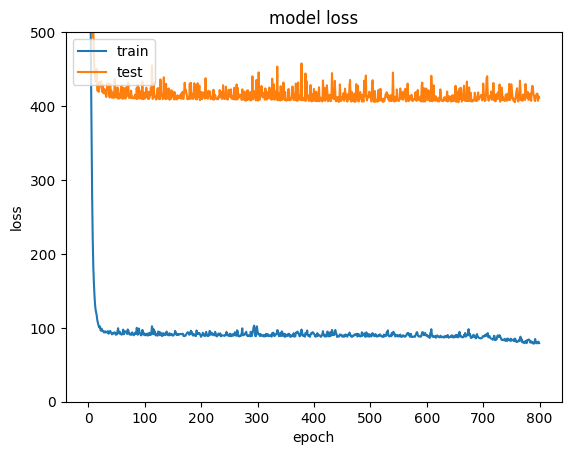

In [ ]:
plt.plot(train_history)
plt.plot(val_history)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

ax = plt.gca()
ax.set_ylim(top=500, bottom = 0)
# Show figure
plt.show()

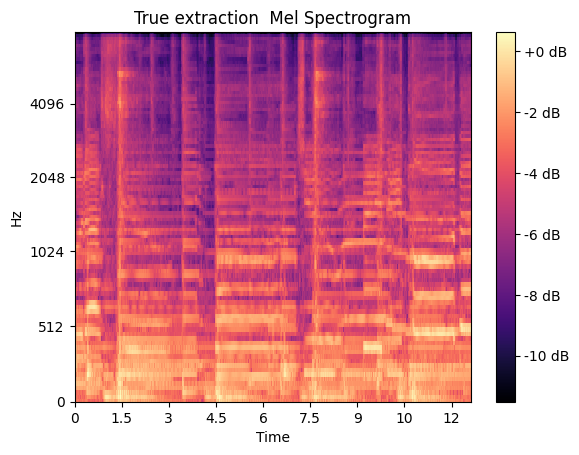

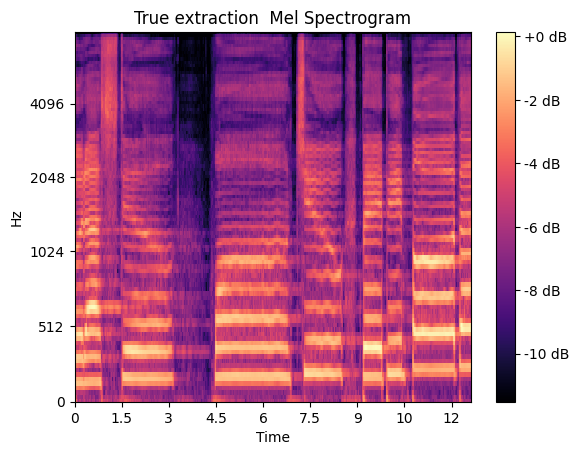

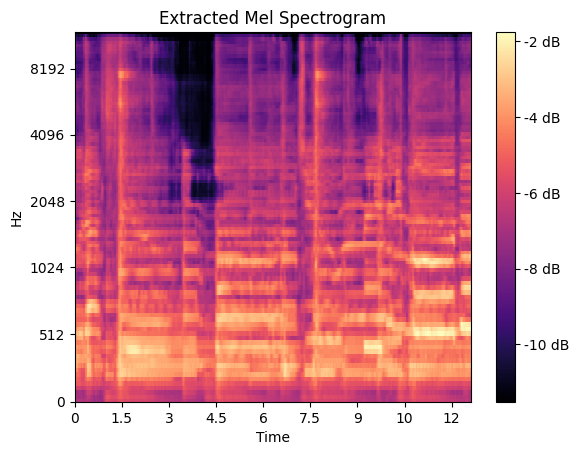

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_train_vocals[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)



# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_train_vocals[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)



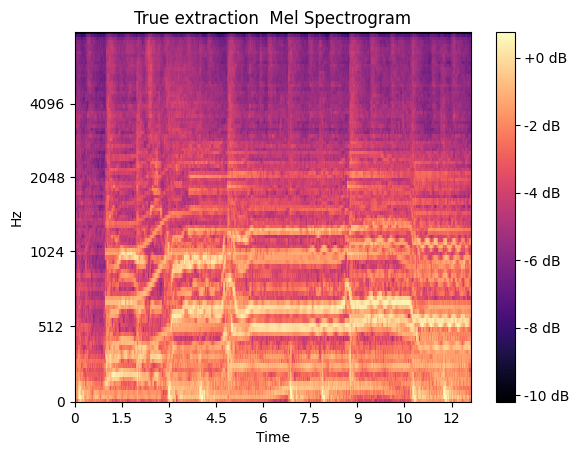

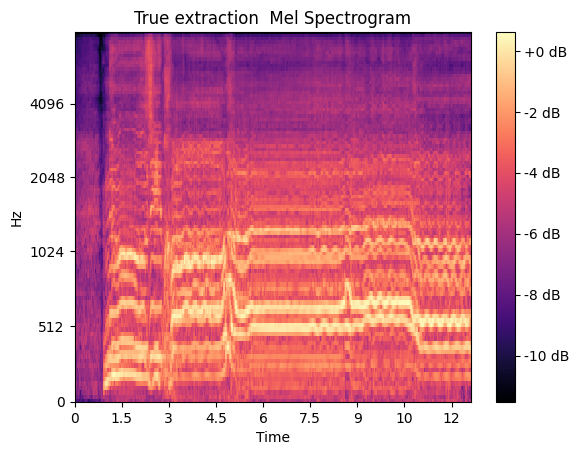

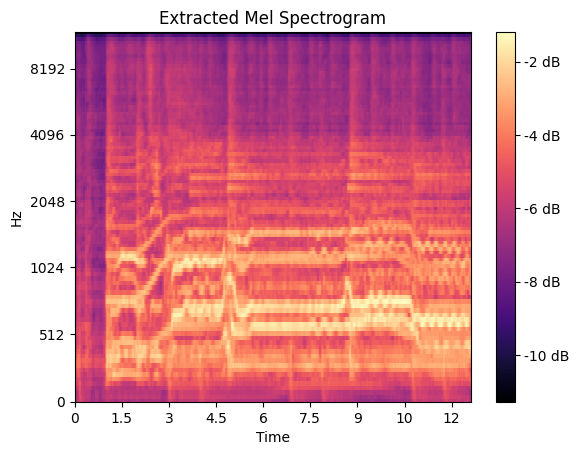

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_test[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)



# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_test[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix  Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)

## Drums

In [ ]:
train_history_drums = []
val_history_drums = []

for epoch in range(num_epochs):
   train_loss = train_epoch(model, device, train_loader_drums, optimizer)
   val_loss = test_epoch(model, device, valid_loader_drums)
   print('\n EPOCH %1.0f/%2.0f \t train loss: %.3f \t val loss: %.3f'%(epoch + 1, num_epochs, train_loss, val_loss))
   train_history_drums.append(train_loss)
   val_history_drums.append(val_loss)

100%|██████████| 14/14 [00:02<00:00,  5.03it/s]



 EPOCH 1/800 	 train loss: 27690.168 	 val loss: 11807.812


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 2/800 	 train loss: 3229.710 	 val loss: 1213.444


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 3/800 	 train loss: 536.301 	 val loss: 292.265


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 4/800 	 train loss: 229.954 	 val loss: 183.443


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 5/800 	 train loss: 179.535 	 val loss: 155.189


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 6/800 	 train loss: 156.455 	 val loss: 130.396


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]



 EPOCH 7/800 	 train loss: 138.682 	 val loss: 111.558


100%|██████████| 14/14 [00:02<00:00,  5.02it/s]



 EPOCH 8/800 	 train loss: 122.308 	 val loss: 97.391


100%|██████████| 14/14 [00:02<00:00,  5.01it/s]



 EPOCH 9/800 	 train loss: 109.799 	 val loss: 80.591


100%|██████████| 14/14 [00:02<00:00,  5.01it/s]



 EPOCH 10/800 	 train loss: 96.778 	 val loss: 67.959


100%|██████████| 14/14 [00:02<00:00,  5.01it/s]



 EPOCH 11/800 	 train loss: 87.317 	 val loss: 59.097


100%|██████████| 14/14 [00:02<00:00,  5.00it/s]



 EPOCH 12/800 	 train loss: 78.390 	 val loss: 51.498


100%|██████████| 14/14 [00:02<00:00,  5.02it/s]



 EPOCH 13/800 	 train loss: 71.727 	 val loss: 52.599


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]



 EPOCH 14/800 	 train loss: 67.498 	 val loss: 47.753


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 15/800 	 train loss: 65.143 	 val loss: 40.227


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 16/800 	 train loss: 61.987 	 val loss: 36.890


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 17/800 	 train loss: 61.515 	 val loss: 35.698


100%|██████████| 14/14 [00:02<00:00,  5.05it/s]



 EPOCH 18/800 	 train loss: 61.031 	 val loss: 34.591


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 19/800 	 train loss: 61.392 	 val loss: 33.795


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 20/800 	 train loss: 59.167 	 val loss: 34.810


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 21/800 	 train loss: 59.680 	 val loss: 35.112


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 22/800 	 train loss: 58.463 	 val loss: 37.268


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 23/800 	 train loss: 60.291 	 val loss: 43.410


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 24/800 	 train loss: 61.562 	 val loss: 39.891


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 25/800 	 train loss: 59.569 	 val loss: 39.284


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 26/800 	 train loss: 59.912 	 val loss: 36.299


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 27/800 	 train loss: 62.282 	 val loss: 32.835


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 28/800 	 train loss: 63.442 	 val loss: 32.266


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 29/800 	 train loss: 58.061 	 val loss: 33.000


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 30/800 	 train loss: 57.329 	 val loss: 34.545


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 31/800 	 train loss: 58.182 	 val loss: 41.662


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 32/800 	 train loss: 59.198 	 val loss: 35.759


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 33/800 	 train loss: 58.479 	 val loss: 32.830


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 34/800 	 train loss: 56.249 	 val loss: 32.891


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 35/800 	 train loss: 56.196 	 val loss: 31.572


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 36/800 	 train loss: 56.363 	 val loss: 31.508


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]



 EPOCH 37/800 	 train loss: 57.650 	 val loss: 33.713


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 38/800 	 train loss: 56.649 	 val loss: 33.214


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 39/800 	 train loss: 59.710 	 val loss: 30.573


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 40/800 	 train loss: 55.791 	 val loss: 30.649


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 41/800 	 train loss: 55.397 	 val loss: 31.229


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]



 EPOCH 42/800 	 train loss: 55.158 	 val loss: 30.906


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 43/800 	 train loss: 54.770 	 val loss: 32.894


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 44/800 	 train loss: 55.621 	 val loss: 35.304


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 45/800 	 train loss: 55.980 	 val loss: 32.711


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 46/800 	 train loss: 55.405 	 val loss: 35.413


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 47/800 	 train loss: 54.994 	 val loss: 30.793


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 48/800 	 train loss: 55.133 	 val loss: 30.201


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 49/800 	 train loss: 54.684 	 val loss: 31.154


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 50/800 	 train loss: 54.825 	 val loss: 31.252


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]



 EPOCH 51/800 	 train loss: 54.715 	 val loss: 30.293


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 52/800 	 train loss: 54.125 	 val loss: 30.264


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 53/800 	 train loss: 54.692 	 val loss: 30.315


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 54/800 	 train loss: 54.461 	 val loss: 30.142


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 55/800 	 train loss: 54.419 	 val loss: 29.871


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 56/800 	 train loss: 55.261 	 val loss: 29.777


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 57/800 	 train loss: 56.076 	 val loss: 32.260


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 58/800 	 train loss: 55.859 	 val loss: 31.345


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 59/800 	 train loss: 54.653 	 val loss: 31.423


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 60/800 	 train loss: 54.963 	 val loss: 30.160


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 61/800 	 train loss: 54.828 	 val loss: 29.527


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 62/800 	 train loss: 54.842 	 val loss: 30.285


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 63/800 	 train loss: 54.867 	 val loss: 29.974


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 64/800 	 train loss: 54.233 	 val loss: 30.718


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 65/800 	 train loss: 55.175 	 val loss: 32.664


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 66/800 	 train loss: 54.009 	 val loss: 30.998


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 67/800 	 train loss: 53.850 	 val loss: 30.592


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 68/800 	 train loss: 53.923 	 val loss: 30.712


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 69/800 	 train loss: 53.906 	 val loss: 31.098


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 70/800 	 train loss: 55.787 	 val loss: 30.248


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 71/800 	 train loss: 54.568 	 val loss: 29.931


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 72/800 	 train loss: 54.920 	 val loss: 29.320


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 73/800 	 train loss: 56.117 	 val loss: 30.472


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 74/800 	 train loss: 54.399 	 val loss: 30.343


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 75/800 	 train loss: 57.139 	 val loss: 29.787


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 76/800 	 train loss: 57.920 	 val loss: 32.018


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 77/800 	 train loss: 55.591 	 val loss: 31.356


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 78/800 	 train loss: 54.709 	 val loss: 29.808


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]



 EPOCH 79/800 	 train loss: 55.049 	 val loss: 31.994


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 80/800 	 train loss: 53.931 	 val loss: 29.623


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 81/800 	 train loss: 56.232 	 val loss: 31.621


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 82/800 	 train loss: 54.384 	 val loss: 29.869


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 83/800 	 train loss: 53.732 	 val loss: 30.323


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 84/800 	 train loss: 54.224 	 val loss: 30.104


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 85/800 	 train loss: 54.698 	 val loss: 33.353


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 86/800 	 train loss: 54.132 	 val loss: 31.903


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 87/800 	 train loss: 53.956 	 val loss: 36.115


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 88/800 	 train loss: 53.587 	 val loss: 30.368


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]



 EPOCH 89/800 	 train loss: 54.183 	 val loss: 29.436


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 90/800 	 train loss: 53.382 	 val loss: 30.354


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 91/800 	 train loss: 53.467 	 val loss: 28.865


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 92/800 	 train loss: 53.290 	 val loss: 29.566


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 93/800 	 train loss: 55.475 	 val loss: 30.711


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 94/800 	 train loss: 54.336 	 val loss: 30.318


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 95/800 	 train loss: 55.004 	 val loss: 33.102


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 96/800 	 train loss: 54.359 	 val loss: 30.307


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 97/800 	 train loss: 53.299 	 val loss: 29.237


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]



 EPOCH 98/800 	 train loss: 53.488 	 val loss: 29.560


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 99/800 	 train loss: 52.750 	 val loss: 32.638


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 100/800 	 train loss: 53.336 	 val loss: 30.680


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]



 EPOCH 101/800 	 train loss: 54.349 	 val loss: 29.722


 21%|██▏       | 3/14 [00:00<00:02,  3.82it/s]


KeyboardInterrupt: ignored

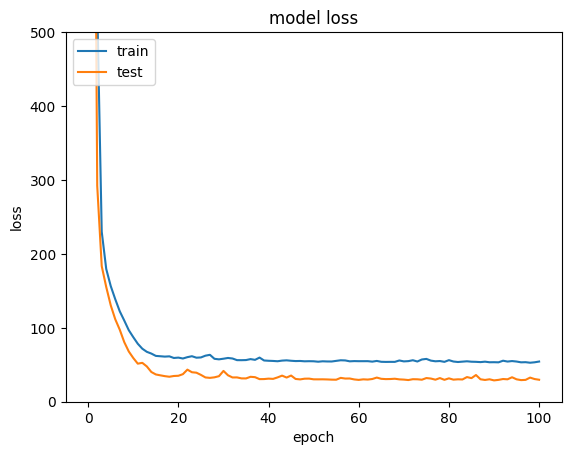

In [ ]:
plt.plot(train_history_drums)
plt.plot(val_history_drums)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

ax = plt.gca()
ax.set_ylim(top=500, bottom = 0)
# Show figure
plt.show()

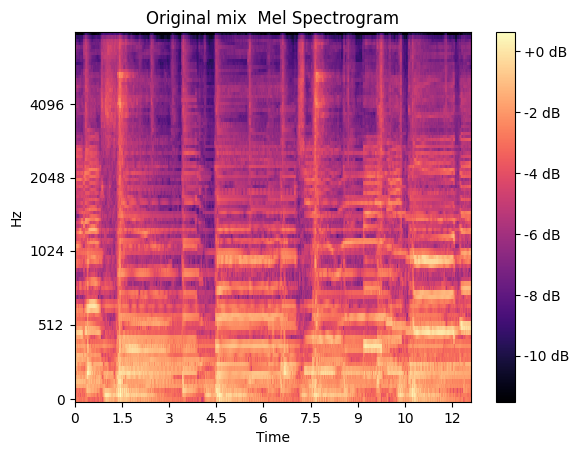

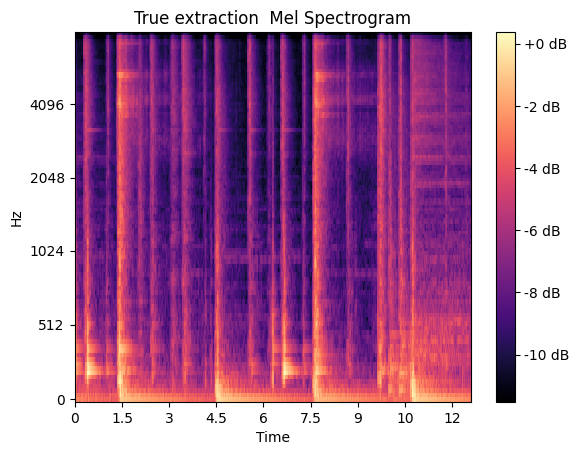

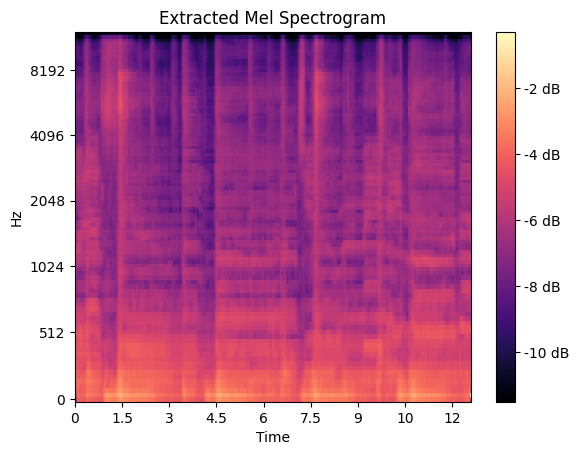

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_train_drums[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)

# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_train_drums[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix  Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)



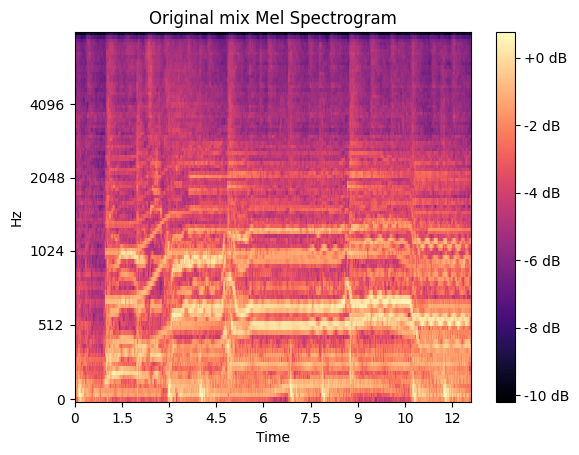

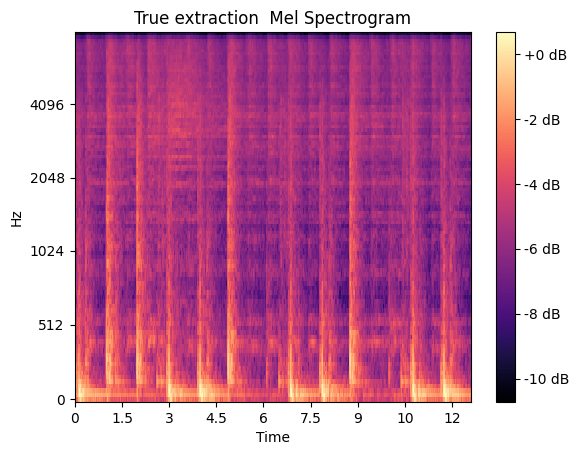

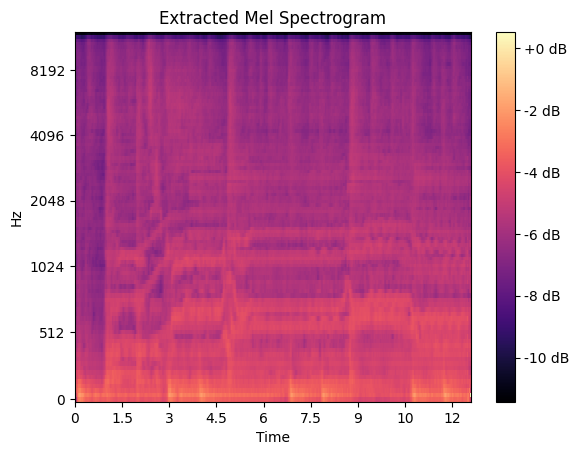

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_test_drums[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)



# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_test_drums[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)



## Bass

In [ ]:
train_history_bass = []
val_history_bass = []

for epoch in range(num_epochs):
   train_loss = train_epoch(model, device, train_loader_bass, optimizer)
   val_loss = test_epoch(model, device, valid_loader_bass)
   print('\n EPOCH %1.0f/%2.0f \t train loss: %.3f \t val loss: %.3f'%(epoch + 1, num_epochs, train_loss, val_loss))
   train_history_bass.append(train_loss)
   val_history_bass.append(val_loss)

100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 1/800 	 train loss: 12675.398 	 val loss: 1609.744


100%|██████████| 14/14 [00:02<00:00,  5.47it/s]



 EPOCH 2/800 	 train loss: 2178.365 	 val loss: 1556.531


100%|██████████| 14/14 [00:02<00:00,  5.33it/s]



 EPOCH 3/800 	 train loss: 1995.563 	 val loss: 1527.043


100%|██████████| 14/14 [00:02<00:00,  5.38it/s]



 EPOCH 4/800 	 train loss: 1939.551 	 val loss: 1469.776


100%|██████████| 14/14 [00:02<00:00,  5.46it/s]



 EPOCH 5/800 	 train loss: 1887.952 	 val loss: 1431.957


100%|██████████| 14/14 [00:02<00:00,  5.40it/s]



 EPOCH 6/800 	 train loss: 1833.525 	 val loss: 1355.402


100%|██████████| 14/14 [00:02<00:00,  5.41it/s]



 EPOCH 7/800 	 train loss: 1753.379 	 val loss: 1180.924


100%|██████████| 14/14 [00:02<00:00,  5.47it/s]



 EPOCH 8/800 	 train loss: 1524.824 	 val loss: 992.886


100%|██████████| 14/14 [00:02<00:00,  5.41it/s]



 EPOCH 9/800 	 train loss: 1400.559 	 val loss: 1484.634


100%|██████████| 14/14 [00:02<00:00,  5.25it/s]



 EPOCH 10/800 	 train loss: 1509.062 	 val loss: 979.099


100%|██████████| 14/14 [00:02<00:00,  5.42it/s]



 EPOCH 11/800 	 train loss: 1355.640 	 val loss: 1051.386


100%|██████████| 14/14 [00:02<00:00,  5.32it/s]



 EPOCH 12/800 	 train loss: 1407.320 	 val loss: 1053.011


100%|██████████| 14/14 [00:02<00:00,  5.24it/s]



 EPOCH 13/800 	 train loss: 1344.503 	 val loss: 984.231


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 14/800 	 train loss: 1327.507 	 val loss: 963.676


100%|██████████| 14/14 [00:02<00:00,  5.28it/s]



 EPOCH 15/800 	 train loss: 1323.790 	 val loss: 945.043


100%|██████████| 14/14 [00:02<00:00,  5.38it/s]



 EPOCH 16/800 	 train loss: 1451.117 	 val loss: 1007.208


100%|██████████| 14/14 [00:02<00:00,  5.40it/s]



 EPOCH 17/800 	 train loss: 1309.425 	 val loss: 927.002


100%|██████████| 14/14 [00:02<00:00,  5.38it/s]



 EPOCH 18/800 	 train loss: 1318.804 	 val loss: 946.972


100%|██████████| 14/14 [00:02<00:00,  5.38it/s]



 EPOCH 19/800 	 train loss: 1316.298 	 val loss: 1023.311


100%|██████████| 14/14 [00:02<00:00,  5.36it/s]



 EPOCH 20/800 	 train loss: 1413.303 	 val loss: 923.925


100%|██████████| 14/14 [00:02<00:00,  5.36it/s]



 EPOCH 21/800 	 train loss: 1404.297 	 val loss: 967.900


100%|██████████| 14/14 [00:02<00:00,  5.34it/s]



 EPOCH 22/800 	 train loss: 1333.022 	 val loss: 951.179


100%|██████████| 14/14 [00:02<00:00,  5.34it/s]



 EPOCH 23/800 	 train loss: 1340.167 	 val loss: 946.173


100%|██████████| 14/14 [00:02<00:00,  5.34it/s]



 EPOCH 24/800 	 train loss: 1319.726 	 val loss: 952.574


100%|██████████| 14/14 [00:02<00:00,  5.34it/s]



 EPOCH 25/800 	 train loss: 1306.396 	 val loss: 951.736


100%|██████████| 14/14 [00:02<00:00,  5.33it/s]



 EPOCH 26/800 	 train loss: 1324.856 	 val loss: 937.325


100%|██████████| 14/14 [00:02<00:00,  5.31it/s]



 EPOCH 27/800 	 train loss: 1322.268 	 val loss: 922.755


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 28/800 	 train loss: 1349.169 	 val loss: 937.078


100%|██████████| 14/14 [00:02<00:00,  5.34it/s]



 EPOCH 29/800 	 train loss: 1303.831 	 val loss: 922.285


100%|██████████| 14/14 [00:02<00:00,  5.32it/s]



 EPOCH 30/800 	 train loss: 1292.742 	 val loss: 941.494


100%|██████████| 14/14 [00:02<00:00,  5.32it/s]



 EPOCH 31/800 	 train loss: 1313.305 	 val loss: 958.848


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 32/800 	 train loss: 1303.742 	 val loss: 969.859


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 33/800 	 train loss: 1305.118 	 val loss: 918.105


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 34/800 	 train loss: 1334.531 	 val loss: 957.063


100%|██████████| 14/14 [00:02<00:00,  5.30it/s]



 EPOCH 35/800 	 train loss: 1358.819 	 val loss: 940.434


100%|██████████| 14/14 [00:02<00:00,  5.30it/s]



 EPOCH 36/800 	 train loss: 1305.204 	 val loss: 1048.644


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 37/800 	 train loss: 1333.863 	 val loss: 1023.691


100%|██████████| 14/14 [00:02<00:00,  5.27it/s]



 EPOCH 38/800 	 train loss: 1335.138 	 val loss: 1113.527


100%|██████████| 14/14 [00:02<00:00,  5.28it/s]



 EPOCH 39/800 	 train loss: 1369.479 	 val loss: 992.372


100%|██████████| 14/14 [00:02<00:00,  5.29it/s]



 EPOCH 40/800 	 train loss: 1361.850 	 val loss: 919.131


100%|██████████| 14/14 [00:02<00:00,  5.27it/s]



 EPOCH 41/800 	 train loss: 1297.340 	 val loss: 995.967


100%|██████████| 14/14 [00:02<00:00,  5.27it/s]



 EPOCH 42/800 	 train loss: 1334.225 	 val loss: 942.099


100%|██████████| 14/14 [00:02<00:00,  5.27it/s]



 EPOCH 43/800 	 train loss: 1291.258 	 val loss: 919.219


100%|██████████| 14/14 [00:02<00:00,  5.28it/s]



 EPOCH 44/800 	 train loss: 1291.136 	 val loss: 953.151


100%|██████████| 14/14 [00:02<00:00,  5.27it/s]



 EPOCH 45/800 	 train loss: 1301.838 	 val loss: 984.943


100%|██████████| 14/14 [00:02<00:00,  5.24it/s]



 EPOCH 46/800 	 train loss: 1273.837 	 val loss: 918.667


100%|██████████| 14/14 [00:02<00:00,  5.25it/s]



 EPOCH 47/800 	 train loss: 1286.377 	 val loss: 928.987


100%|██████████| 14/14 [00:02<00:00,  5.25it/s]



 EPOCH 48/800 	 train loss: 1280.812 	 val loss: 954.480


100%|██████████| 14/14 [00:02<00:00,  5.24it/s]



 EPOCH 49/800 	 train loss: 1304.990 	 val loss: 957.338


100%|██████████| 14/14 [00:02<00:00,  5.25it/s]



 EPOCH 50/800 	 train loss: 1366.151 	 val loss: 962.090


100%|██████████| 14/14 [00:02<00:00,  5.24it/s]



 EPOCH 51/800 	 train loss: 1363.471 	 val loss: 927.284


100%|██████████| 14/14 [00:02<00:00,  5.23it/s]



 EPOCH 52/800 	 train loss: 1308.753 	 val loss: 966.873


100%|██████████| 14/14 [00:02<00:00,  5.23it/s]



 EPOCH 53/800 	 train loss: 1300.727 	 val loss: 929.163


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 54/800 	 train loss: 1298.357 	 val loss: 1059.627


100%|██████████| 14/14 [00:02<00:00,  5.26it/s]



 EPOCH 55/800 	 train loss: 1356.432 	 val loss: 942.159


100%|██████████| 14/14 [00:02<00:00,  5.23it/s]



 EPOCH 56/800 	 train loss: 1414.058 	 val loss: 962.010


100%|██████████| 14/14 [00:02<00:00,  5.21it/s]



 EPOCH 57/800 	 train loss: 1523.822 	 val loss: 925.365


100%|██████████| 14/14 [00:02<00:00,  5.23it/s]



 EPOCH 58/800 	 train loss: 1309.024 	 val loss: 920.885


100%|██████████| 14/14 [00:02<00:00,  5.24it/s]



 EPOCH 59/800 	 train loss: 1280.644 	 val loss: 934.533


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 60/800 	 train loss: 1314.001 	 val loss: 917.364


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 61/800 	 train loss: 1303.073 	 val loss: 923.885


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 62/800 	 train loss: 1284.740 	 val loss: 924.617


100%|██████████| 14/14 [00:02<00:00,  5.23it/s]



 EPOCH 63/800 	 train loss: 1305.806 	 val loss: 980.615


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 64/800 	 train loss: 1385.516 	 val loss: 942.824


100%|██████████| 14/14 [00:02<00:00,  5.25it/s]



 EPOCH 65/800 	 train loss: 1333.647 	 val loss: 941.173


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 66/800 	 train loss: 1278.409 	 val loss: 928.203


100%|██████████| 14/14 [00:02<00:00,  5.21it/s]



 EPOCH 67/800 	 train loss: 1285.020 	 val loss: 942.808


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 68/800 	 train loss: 1334.883 	 val loss: 1022.043


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 69/800 	 train loss: 1339.833 	 val loss: 979.677


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 70/800 	 train loss: 1301.025 	 val loss: 949.942


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 71/800 	 train loss: 1272.454 	 val loss: 920.593


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 72/800 	 train loss: 1292.265 	 val loss: 977.632


100%|██████████| 14/14 [00:02<00:00,  5.21it/s]



 EPOCH 73/800 	 train loss: 1297.222 	 val loss: 953.336


100%|██████████| 14/14 [00:02<00:00,  5.22it/s]



 EPOCH 74/800 	 train loss: 1287.241 	 val loss: 918.957


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 75/800 	 train loss: 1302.386 	 val loss: 923.841


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]



 EPOCH 76/800 	 train loss: 1285.053 	 val loss: 926.523


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 77/800 	 train loss: 1302.227 	 val loss: 920.949


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 78/800 	 train loss: 1278.088 	 val loss: 939.488


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 79/800 	 train loss: 1274.816 	 val loss: 928.033


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 80/800 	 train loss: 1285.023 	 val loss: 923.717


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 81/800 	 train loss: 1351.378 	 val loss: 944.450


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 82/800 	 train loss: 1285.133 	 val loss: 969.510


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 83/800 	 train loss: 1300.378 	 val loss: 926.710


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 84/800 	 train loss: 1287.402 	 val loss: 941.827


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 85/800 	 train loss: 1305.274 	 val loss: 926.239


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 86/800 	 train loss: 1290.567 	 val loss: 933.504


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 87/800 	 train loss: 1313.737 	 val loss: 949.515


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 88/800 	 train loss: 1299.540 	 val loss: 933.776


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 89/800 	 train loss: 1272.718 	 val loss: 922.399


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 90/800 	 train loss: 1275.964 	 val loss: 920.669


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 91/800 	 train loss: 1278.156 	 val loss: 988.551


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]



 EPOCH 92/800 	 train loss: 1347.704 	 val loss: 919.728


100%|██████████| 14/14 [00:02<00:00,  5.20it/s]



 EPOCH 93/800 	 train loss: 1302.094 	 val loss: 922.838


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 94/800 	 train loss: 1310.580 	 val loss: 970.672


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 95/800 	 train loss: 1309.660 	 val loss: 972.668


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 96/800 	 train loss: 1347.261 	 val loss: 927.083


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 97/800 	 train loss: 1292.128 	 val loss: 922.386


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 98/800 	 train loss: 1291.809 	 val loss: 923.270


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 99/800 	 train loss: 1309.741 	 val loss: 1002.336


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 100/800 	 train loss: 1294.766 	 val loss: 944.658


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 101/800 	 train loss: 1277.834 	 val loss: 930.193


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 102/800 	 train loss: 1291.830 	 val loss: 956.810


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 103/800 	 train loss: 1280.671 	 val loss: 923.798


100%|██████████| 14/14 [00:02<00:00,  5.19it/s]



 EPOCH 104/800 	 train loss: 1295.778 	 val loss: 921.992


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 105/800 	 train loss: 1273.546 	 val loss: 944.031


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 106/800 	 train loss: 1289.441 	 val loss: 935.743


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 107/800 	 train loss: 1288.951 	 val loss: 922.028


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 108/800 	 train loss: 1276.141 	 val loss: 925.159


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 109/800 	 train loss: 1290.393 	 val loss: 942.772


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 110/800 	 train loss: 1290.209 	 val loss: 944.907


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 111/800 	 train loss: 1298.794 	 val loss: 937.823


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 112/800 	 train loss: 1358.652 	 val loss: 1073.958


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 113/800 	 train loss: 1307.127 	 val loss: 930.827


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 114/800 	 train loss: 1275.168 	 val loss: 923.272


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 115/800 	 train loss: 1284.202 	 val loss: 922.957


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 116/800 	 train loss: 1293.663 	 val loss: 961.358


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 117/800 	 train loss: 1327.277 	 val loss: 989.825


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 118/800 	 train loss: 1383.219 	 val loss: 1085.721


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 119/800 	 train loss: 1296.905 	 val loss: 926.641


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 120/800 	 train loss: 1279.333 	 val loss: 929.280


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 121/800 	 train loss: 1282.421 	 val loss: 924.128


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 122/800 	 train loss: 1280.580 	 val loss: 922.501


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 123/800 	 train loss: 1283.008 	 val loss: 972.967


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 124/800 	 train loss: 1279.125 	 val loss: 925.767


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 125/800 	 train loss: 1283.772 	 val loss: 922.161


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 126/800 	 train loss: 1345.576 	 val loss: 993.560


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 127/800 	 train loss: 1403.938 	 val loss: 957.725


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 128/800 	 train loss: 1327.890 	 val loss: 1012.178


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]



 EPOCH 129/800 	 train loss: 1304.750 	 val loss: 931.258


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 130/800 	 train loss: 1308.689 	 val loss: 984.559


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 131/800 	 train loss: 1358.927 	 val loss: 983.825


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 132/800 	 train loss: 1280.014 	 val loss: 923.492


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 133/800 	 train loss: 1278.249 	 val loss: 923.814


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 134/800 	 train loss: 1313.324 	 val loss: 1021.831


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 135/800 	 train loss: 1325.677 	 val loss: 930.947


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 136/800 	 train loss: 1292.446 	 val loss: 920.378


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 137/800 	 train loss: 1282.535 	 val loss: 929.663


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 138/800 	 train loss: 1279.909 	 val loss: 921.931


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 139/800 	 train loss: 1315.895 	 val loss: 952.864


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 140/800 	 train loss: 1290.207 	 val loss: 949.146


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 141/800 	 train loss: 1280.576 	 val loss: 933.945


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 142/800 	 train loss: 1284.461 	 val loss: 970.689


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 143/800 	 train loss: 1300.520 	 val loss: 939.732


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 144/800 	 train loss: 1280.334 	 val loss: 929.379


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]



 EPOCH 145/800 	 train loss: 1383.142 	 val loss: 978.466


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 146/800 	 train loss: 1476.996 	 val loss: 1229.710


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 147/800 	 train loss: 1355.222 	 val loss: 936.693


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 148/800 	 train loss: 1328.712 	 val loss: 937.739


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 149/800 	 train loss: 1297.207 	 val loss: 940.293


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 150/800 	 train loss: 1295.931 	 val loss: 930.585


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 151/800 	 train loss: 1281.596 	 val loss: 941.481


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 152/800 	 train loss: 1285.817 	 val loss: 973.630


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 153/800 	 train loss: 1296.124 	 val loss: 932.066


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 154/800 	 train loss: 1294.863 	 val loss: 956.637


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 155/800 	 train loss: 1294.926 	 val loss: 952.940


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 156/800 	 train loss: 1290.597 	 val loss: 964.305


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 157/800 	 train loss: 1277.752 	 val loss: 927.491


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 158/800 	 train loss: 1294.431 	 val loss: 996.856


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 159/800 	 train loss: 1303.681 	 val loss: 941.665


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 160/800 	 train loss: 1299.079 	 val loss: 924.726


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 161/800 	 train loss: 1268.903 	 val loss: 941.264


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 162/800 	 train loss: 1286.731 	 val loss: 964.759


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 163/800 	 train loss: 1310.850 	 val loss: 925.884


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 164/800 	 train loss: 1278.368 	 val loss: 923.153


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 165/800 	 train loss: 1280.952 	 val loss: 965.881


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 166/800 	 train loss: 1309.164 	 val loss: 935.742


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 167/800 	 train loss: 1320.034 	 val loss: 972.465


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 168/800 	 train loss: 1357.830 	 val loss: 968.698


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]



 EPOCH 169/800 	 train loss: 1283.632 	 val loss: 924.394


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 170/800 	 train loss: 1298.327 	 val loss: 958.615


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 171/800 	 train loss: 1292.992 	 val loss: 943.337


100%|██████████| 14/14 [00:02<00:00,  5.17it/s]



 EPOCH 172/800 	 train loss: 1296.609 	 val loss: 1011.380


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]



 EPOCH 173/800 	 train loss: 1325.490 	 val loss: 980.279


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 174/800 	 train loss: 1324.177 	 val loss: 957.950


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 175/800 	 train loss: 1305.833 	 val loss: 926.818


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]



 EPOCH 176/800 	 train loss: 1277.718 	 val loss: 932.131


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]



 EPOCH 177/800 	 train loss: 1274.929 	 val loss: 931.241


100%|██████████| 14/14 [00:02<00:00,  4.79it/s]



 EPOCH 178/800 	 train loss: 1277.028 	 val loss: 925.877


100%|██████████| 14/14 [00:02<00:00,  5.16it/s]



 EPOCH 179/800 	 train loss: 1275.872 	 val loss: 932.432


100%|██████████| 14/14 [00:02<00:00,  5.18it/s]



 EPOCH 180/800 	 train loss: 1297.874 	 val loss: 987.782


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]



 EPOCH 181/800 	 train loss: 1295.412 	 val loss: 947.957


 29%|██▊       | 4/14 [00:00<00:02,  4.14it/s]


KeyboardInterrupt: ignored

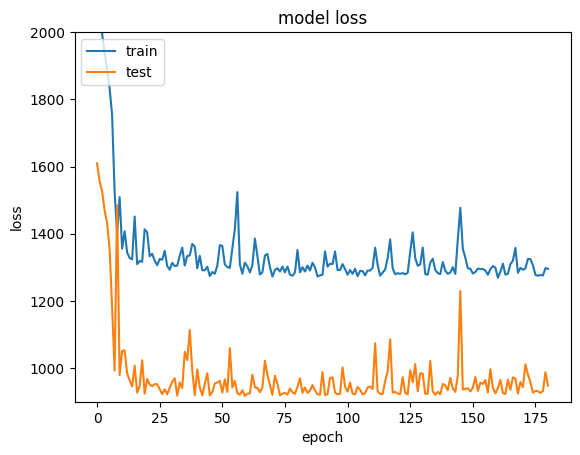

In [ ]:
plt.plot(train_history_bass)
plt.plot(val_history_bass)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

ax = plt.gca()
ax.set_ylim(top=2000, bottom = 900)
# Show figure
plt.show()

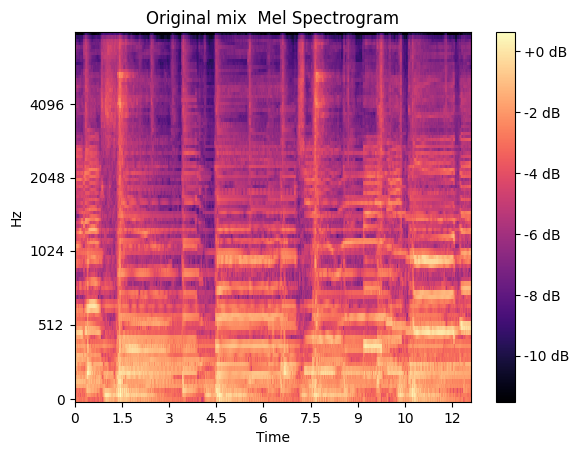

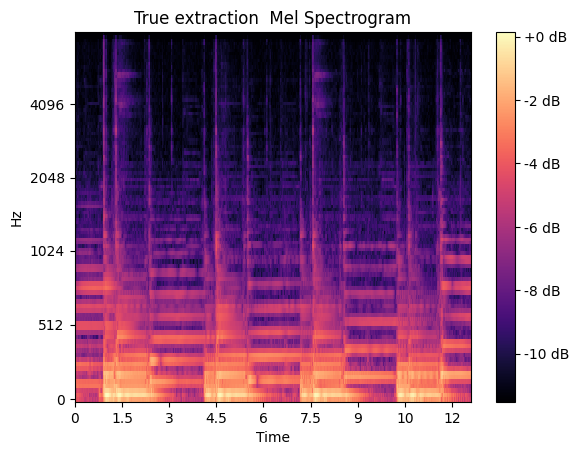

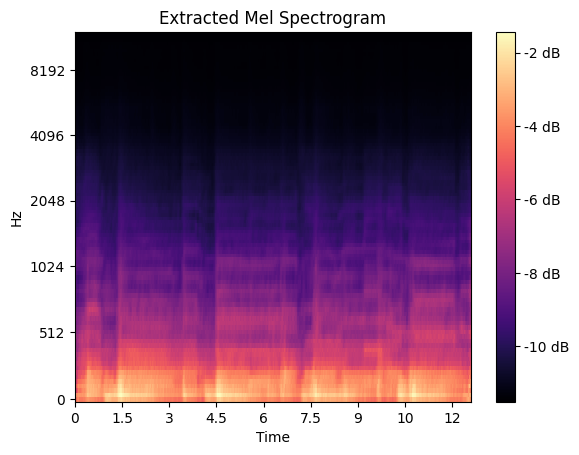

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_train_bass[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)

# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_train_bass[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix  Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)



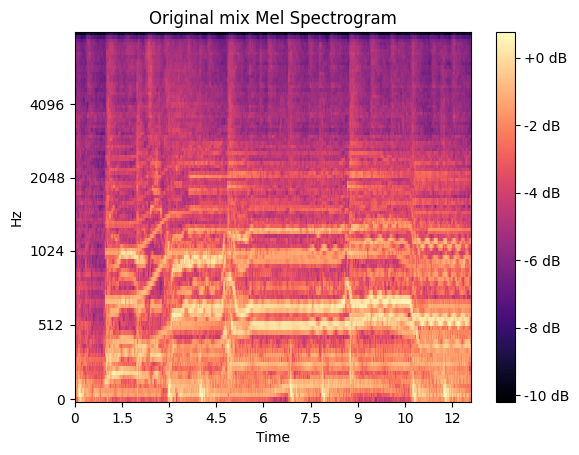

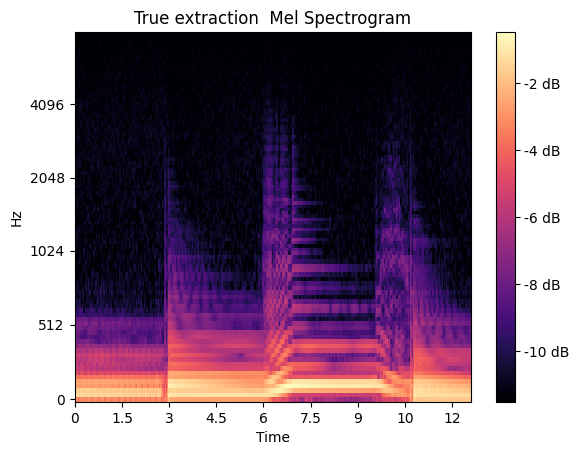

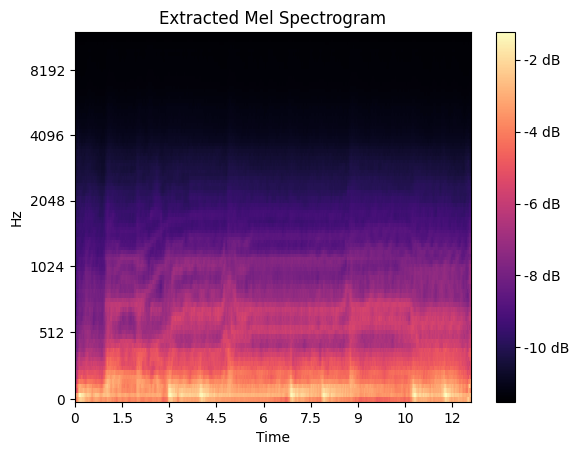

/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000
Loading '/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000'
Complete.
Removing weight norm...


In [ ]:
import IPython
from IPython.display import Audio
nAudio = 1
specs_numpy = []
# Load the spectrogram from a file
mix = torch.from_numpy(X_test_bass[nAudio]).unsqueeze(0)
mix = mix.to(device)
# We generate the prediction introducing the mix audio
pred = model(mix)



# We perform the inverse operation than before, we squeeze the 4D tensor to get a 2D one
# this is carried out because librosa accepts 2D numpy 
pred_squeezed = pred.squeeze(0)
pred_squeezed = pred_squeezed.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
pred_cpu = pred_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
pred_numpy = pred_cpu.detach().numpy()

# De-normalize
pred_numpy = denorm(pred_numpy)

#Preparation of the mix
mix = mix.squeeze(0)
mix_squeezed = mix.squeeze(0)
# move PyTorch tensor to CPU to perform the operations with librosa (stored in cpu)
mix_cpu = mix_squeezed.to('cpu')
# convert PyTorch tensor to numpy array 
mix_numpy = mix_cpu.detach().numpy()
mix_numpy = denorm(mix_numpy)


#Groundtruth preparation
gt_numpy = y_test_bass[nAudio].squeeze(0)
gt_numpy = denorm(gt_numpy)

specs_numpy.append(mix_numpy)
specs_numpy.append(gt_numpy)
specs_numpy.append(pred_numpy)

librosa.display.specshow(mix_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Original mix Mel Spectrogram')
plt.show()

librosa.display.specshow(gt_numpy, x_axis='time', y_axis='mel', sr=24000, fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('True extraction  Mel Spectrogram')
plt.show()

librosa.display.specshow(pred_numpy, x_axis='time', y_axis='mel', sr=24000)
plt.colorbar(format='%+2.0f dB')
plt.title('Extracted Mel Spectrogram')
plt.show()

# Load BigVGAN to retrieve audio
generator = Generator(h).to(device)
state_dict_g = load_checkpoint("/content/drive/MyDrive/DLAS-Trabajo/DEMUCS/BigVGAN_checkpoints/bigvgan_24khz_100band/g_05000000", device)
generator.load_state_dict(state_dict_g['generator'])
generator.eval()
generator.remove_weight_norm()
with torch.no_grad():
  for x in specs_numpy:
      # load the mel spectrogram in .npy format
      x = torch.FloatTensor(x).to(device)
      if len(x.shape) == 2:
          x = x.unsqueeze(0)

      y_g_hat = generator(x)
      audio = y_g_hat.squeeze()
      audio = audio * MAX_WAV_VALUE
      audio = audio.cpu().numpy().astype('int16')
      audio_signal = Audio(audio, rate=24000)
      IPython.display.display(audio_signal)



# SDR computation

In [ ]:
!pip install mir_eval

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached mir_eval-0.7-py3-none-any.whl


In [ ]:
import mir_eval
original_signal = gt_numpy
distorted_signal = pred_numpy
# Compute the SDR using mir_eval
sdr, _, _, _ = mir_eval.separation.bss_eval_sources(original_signal, distorted_signal)